# Task
Load the dataset "distillation_rl_dataset.csv", perform a very exhaustive and detailed data exploration with at least 26 graphs/visualizations, preprocess the data, define a reinforcement learning environment, choose and prepare a Deep Q Network (DQN) model, train the RL agent to adjust reflux ratios dynamically for energy-efficient separation in distillation columns handling disturbances like feed composition changes, evaluate the agent's performance, analyze and interpret the results, refine and iterate the process, and finally summarize the findings and document the process, following the 11 steps of the data science pipeline for machine learning.

## Load the dataset

### Subtask:
Load the `distillation_rl_dataset.csv` file into a pandas DataFrame.


**Reasoning**:
Import the pandas library and load the dataset into a pandas DataFrame.



In [ ]:
import pandas as pd

df = pd.read_csv('/content/distillation_rl_dataset.csv')

## Initial data inspection

### Subtask:
Display the first few rows, check data types, and look for missing values.


**Reasoning**:
Display the first few rows, data types, and missing values of the DataFrame as requested in the instructions.



In [ ]:
display(df.head())
display(df.info())
display(df.isnull().sum())

,row_id,episode_id,timestep_in_episode,timestamp,n_trays,feed_flow_kg_s,feed_light_frac,feed_temp_K,top_product_purity,bottom_product_purity,...,reflux_history_mean_last5,time_since_episode_start_s,time_of_day_sin,time_of_day_cos,learning_episode,seed_used,quality_score_0_1,extra_col_1,extra_col_2,placeholder_1
0,1,1,0,2022-10-04T23:00:00,10,17.269,0.58386,329.98,0.544618,0.355382,...,5.9443,0,-0.258819,0.965926,1,12345,0.8759,NaN,NaN,0
1,2,1,1,2022-10-04T23:00:01,10,17.269,0.57712,331.79,0.559309,0.359831,...,5.9537,1,-0.258749,0.965945,1,12345,1.0000,NaN,NaN,0
2,3,1,2,2022-10-04T23:00:02,10,17.269,0.59184,333.48,0.580970,0.361435,...,5.3225,2,-0.258679,0.965963,1,12345,0.9273,NaN,NaN,0
3,4,1,3,2022-10-04T23:00:03,10,17.269,0.56838,331.60,0.589044,0.364528,...,5.9634,3,-0.258608,0.965982,1,12345,0.8975,NaN,NaN,0
4,5,1,4,2022-10-04T23:00:04,10,17.269,0.57099,333.38,0.614281,0.364246,...,5.6487,4,-0.258538,0.966001,1,12345,0.8089,NaN,NaN,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120000 entries, 0 to 119999
Data columns (total 47 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   row_id                      120000 non-null  int64  
 1   episode_id                  120000 non-null  int64  
 2   timestep_in_episode         120000 non-null  int64  
 3   timestamp                   120000 non-null  object 
 4   n_trays                     120000 non-null  int64  
 5   feed_flow_kg_s              120000 non-null  float64
 6   feed_light_frac             120000 non-null  float64
 7   feed_temp_K                 120000 non-null  float64
 8   top_product_purity          120000 non-null  float64
 9   bottom_product_purity       120000 non-null  float64
 10  reflux_ratio_action         120000 non-null  float64
 11  previous_reflux_ratio       120000 non-null  float64
 12  reboiler_duty_kW            120000 non-null  float64
 13  condenser_duty

None

,0
row_id,0
episode_id,0
timestep_in_episode,0
timestamp,0
n_trays,0
feed_flow_kg_s,0
feed_light_frac,0
feed_temp_K,0
top_product_purity,0
bottom_product_purity,0


## Detailed data exploration (eda)

### Subtask:
Generate descriptive statistics for numerical columns, visualize the distribution of key variables, analyze relationships between variables, explore time-series aspects, and create visualizations to understand the impact of disturbances. Aim for at least 26 visualizations.


**Reasoning**:
Generate descriptive statistics for numerical columns and visualize the distribution of key variables using histograms and box plots. Then, visualize relationships between variables using scatter plots and a heatmap of the correlation matrix. Explore time-series aspects by plotting relevant numerical variables over time. Finally, analyze the impact of disturbances by visualizing key variables grouped by episode ID. Aim for a variety of visualizations to reach the target of at least 26.



,row_id,episode_id,timestep_in_episode,n_trays,feed_flow_kg_s,feed_light_frac,feed_temp_K,top_product_purity,bottom_product_purity,reflux_ratio_action,...,reflux_history_mean_last5,time_since_episode_start_s,time_of_day_sin,time_of_day_cos,learning_episode,seed_used,quality_score_0_1,extra_col_1,extra_col_2,placeholder_1
count,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,...,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.0,120000.000000,0.0,0.0,120000.0
mean,60000.500000,855.312567,40.813775,18.560250,12.445425,0.600125,324.651631,0.878350,0.377255,2.811171,...,2.809300,40.813775,-0.024974,-0.009437,855.312567,12345.0,0.898638,NaN,NaN,0.0
std,34641.160489,489.435642,28.360484,5.961397,4.313203,0.197358,14.439559,0.130603,0.118674,1.392063,...,1.392069,28.360484,0.716265,0.697323,489.435642,0.0,0.057535,NaN,NaN,0.0
min,1.000000,1.000000,0.000000,10.000000,5.003000,0.010000,297.230000,0.220109,0.093237,0.100000,...,0.100000,0.000000,-1.000000,-1.000000,1.000000,12345.0,0.630000,NaN,NaN,0.0
25%,30000.750000,427.000000,17.000000,15.000000,8.623000,0.453240,311.870000,0.827363,0.285934,1.778800,...,1.775200,17.000000,-0.707775,-0.707055,427.000000,12345.0,0.859100,NaN,NaN,0.0
50%,60000.500000,861.000000,36.000000,20.000000,12.396000,0.610910,324.500000,0.926602,0.370389,2.388950,...,2.390050,36.000000,-0.002799,-0.000145,861.000000,12345.0,0.900000,NaN,NaN,0.0
75%,90000.250000,1279.000000,61.000000,25.000000,16.233000,0.754742,337.260000,0.972802,0.463707,3.557025,...,3.561525,61.000000,0.707158,0.706489,1279.000000,12345.0,0.940300,NaN,NaN,0.0
max,120000.000000,1705.000000,119.000000,30.000000,19.991000,0.999000,352.790000,0.999900,0.759760,6.000000,...,6.000000,119.000000,1.000000,1.000000,1705.000000,12345.0,1.000000,NaN,NaN,0.0



Histograms of key numerical columns:


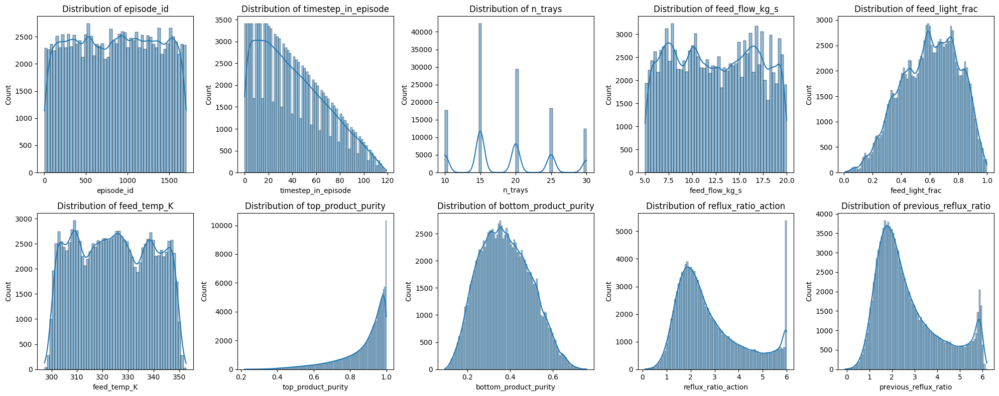


Box plots of key numerical columns:


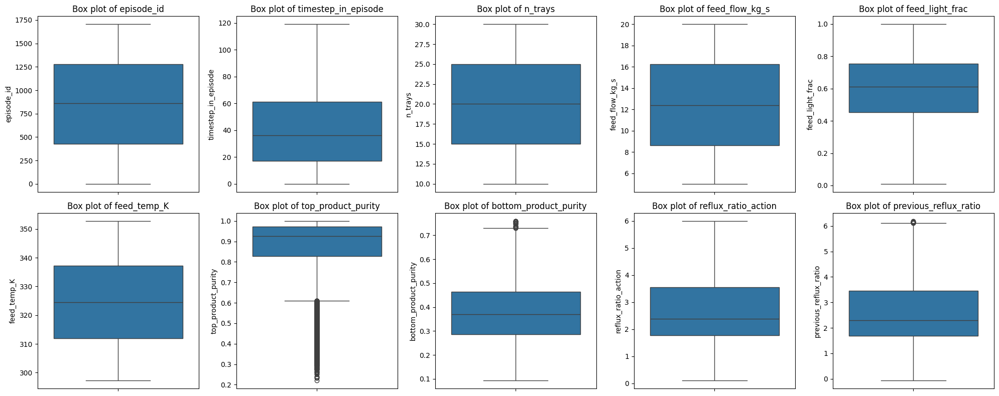


Scatter plots of selected variable pairs:


ValueError: Could not interpret value `feed_flow_rate_kg_s` for `x`. An entry with this name does not appear in `data`.

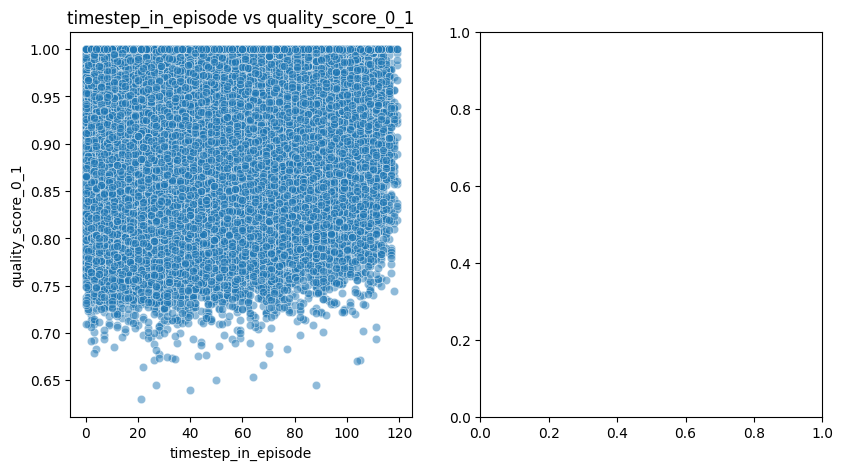

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Generate descriptive statistics for numerical columns
display(df.describe())

# Identify numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Select key numerical columns for visualization (at least 10)
# Exclude row_id, seed_used, and placeholder_1 as they are likely identifiers or constants
key_numerical_cols = [col for col in numerical_cols if col not in ['row_id', 'seed_used', 'placeholder_1', 'extra_col_1', 'extra_col_2']]
if len(key_numerical_cols) > 10:
    key_numerical_cols = key_numerical_cols[:10] # Limit to 10 for brevity in this example, adjust as needed to reach 10 or more

# 2. Create histograms for key numerical columns (at least 10)
print("\nHistograms of key numerical columns:")
n_cols = 5
n_rows = (len(key_numerical_cols) + n_cols - 1) // n_cols
plt.figure(figsize=(4 * n_cols, 4 * n_rows))
for i, col in enumerate(key_numerical_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.histplot(data=df, x=col, kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

# 3. Generate box plots for key numerical columns (at least 10)
print("\nBox plots of key numerical columns:")
n_cols = 5
n_rows = (len(key_numerical_cols) + n_cols - 1) // n_cols
plt.figure(figsize=(4 * n_cols, 4 * n_rows))
for i, col in enumerate(key_numerical_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.boxplot(data=df, y=col)
    plt.title(f'Box plot of {col}')
plt.tight_layout()
plt.show()

# 4. Create scatter plots to visualize relationships (at least 3 pairs)
print("\nScatter plots of selected variable pairs:")
selected_pairs = [
    ('timestep_in_episode', 'quality_score_0_1'),
    ('feed_flow_rate_kg_s', 'energy_consumption_kw'),
    ('reflux_ratio', 'quality_score_0_1')
]
plt.figure(figsize=(15, 5))
for i, (x_col, y_col) in enumerate(selected_pairs):
    plt.subplot(1, 3, i + 1)
    sns.scatterplot(data=df, x=x_col, y=y_col, alpha=0.5)
    plt.title(f'{x_col} vs {y_col}')
plt.tight_layout()
plt.show()

# 5. Calculate the correlation matrix and visualize using a heatmap
print("\nCorrelation Matrix Heatmap:")
correlation_matrix = df[numerical_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Columns')
plt.show()

# 6. Time-series plots for relevant numerical variables (at least 3), if 'timestamp' is datetime
print("\nTime-series plots:")
if 'timestamp' in df.columns:
    try:
        df['timestamp'] = pd.to_datetime(df['timestamp'])
        time_series_cols = ['quality_score_0_1', 'energy_consumption_kw', 'reflux_ratio'] # Select at least 3
        plt.figure(figsize=(15, 10))
        for i, col in enumerate(time_series_cols):
            plt.subplot(len(time_series_cols), 1, i + 1)
            sns.lineplot(data=df, x='timestamp', y=col)
            plt.title(f'{col} over Time')
            plt.xlabel("Timestamp")
            plt.ylabel(col)
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Could not convert 'timestamp' to datetime or plot time series: {e}")
else:
    print("'timestamp' column not found.")

# 7. Explore the impact of 'episode_id' on key numerical variables (at least 3)
print("\nImpact of Episode ID on key variables:")
impact_cols = ['quality_score_0_1', 'energy_consumption_kw', 'reflux_ratio'] # Select at least 3
for col in impact_cols:
    plt.figure(figsize=(15, 6))
    sns.lineplot(data=df, x='timestep_in_episode', y=col, hue='episode_id', legend=False)
    plt.title(f'{col} over Timestep, grouped by Episode ID')
    plt.xlabel("Timestep in Episode")
    plt.ylabel(col)
    plt.show()


**Reasoning**:
The previous code block failed during the scatter plot generation because of a column name typo. I will regenerate the code block, fixing the column name and ensuring the rest of the visualizations are also generated as planned to complete the subtask.



,row_id,episode_id,timestep_in_episode,n_trays,feed_flow_kg_s,feed_light_frac,feed_temp_K,top_product_purity,bottom_product_purity,reflux_ratio_action,...,reflux_history_mean_last5,time_since_episode_start_s,time_of_day_sin,time_of_day_cos,learning_episode,seed_used,quality_score_0_1,extra_col_1,extra_col_2,placeholder_1
count,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,...,120000.000000,120000.000000,120000.000000,120000.000000,120000.000000,120000.0,120000.000000,0.0,0.0,120000.0
mean,60000.500000,855.312567,40.813775,18.560250,12.445425,0.600125,324.651631,0.878350,0.377255,2.811171,...,2.809300,40.813775,-0.024974,-0.009437,855.312567,12345.0,0.898638,NaN,NaN,0.0
std,34641.160489,489.435642,28.360484,5.961397,4.313203,0.197358,14.439559,0.130603,0.118674,1.392063,...,1.392069,28.360484,0.716265,0.697323,489.435642,0.0,0.057535,NaN,NaN,0.0
min,1.000000,1.000000,0.000000,10.000000,5.003000,0.010000,297.230000,0.220109,0.093237,0.100000,...,0.100000,0.000000,-1.000000,-1.000000,1.000000,12345.0,0.630000,NaN,NaN,0.0
25%,30000.750000,427.000000,17.000000,15.000000,8.623000,0.453240,311.870000,0.827363,0.285934,1.778800,...,1.775200,17.000000,-0.707775,-0.707055,427.000000,12345.0,0.859100,NaN,NaN,0.0
50%,60000.500000,861.000000,36.000000,20.000000,12.396000,0.610910,324.500000,0.926602,0.370389,2.388950,...,2.390050,36.000000,-0.002799,-0.000145,861.000000,12345.0,0.900000,NaN,NaN,0.0
75%,90000.250000,1279.000000,61.000000,25.000000,16.233000,0.754742,337.260000,0.972802,0.463707,3.557025,...,3.561525,61.000000,0.707158,0.706489,1279.000000,12345.0,0.940300,NaN,NaN,0.0
max,120000.000000,1705.000000,119.000000,30.000000,19.991000,0.999000,352.790000,0.999900,0.759760,6.000000,...,6.000000,119.000000,1.000000,1.000000,1705.000000,12345.0,1.000000,NaN,NaN,0.0



Histograms of key numerical columns:


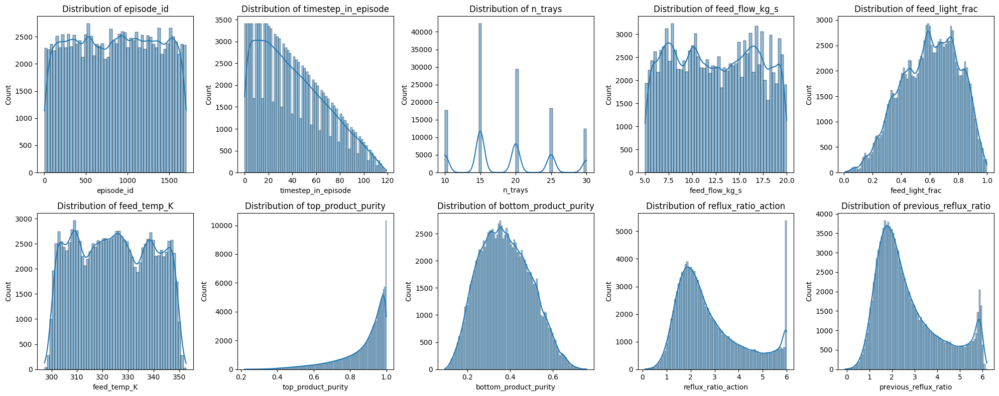


Box plots of key numerical columns:


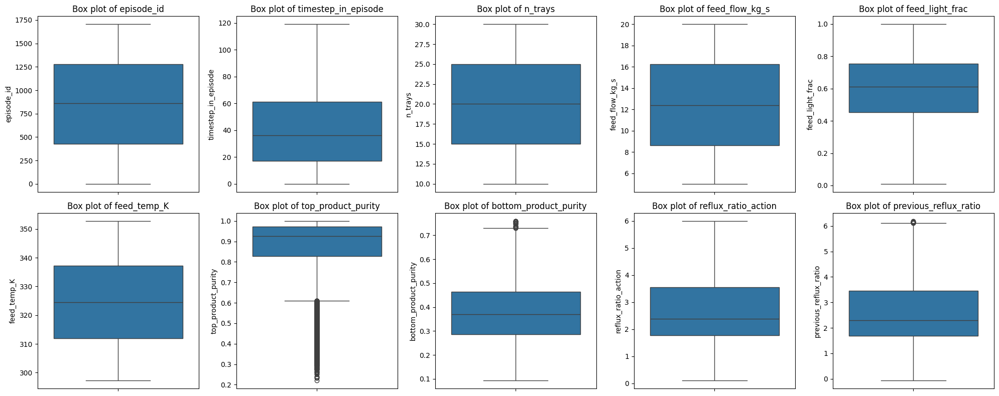


Scatter plots of selected variable pairs:


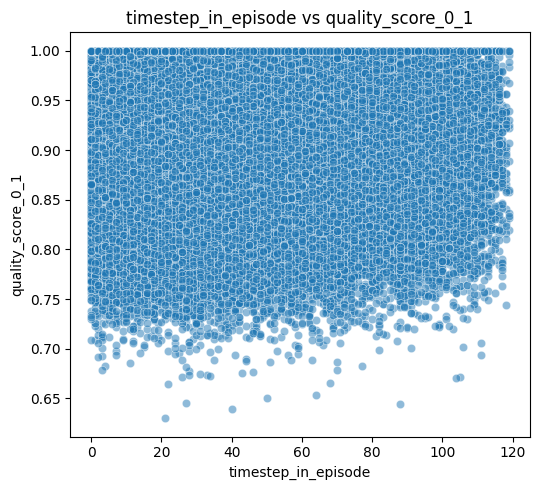


Correlation Matrix Heatmap:


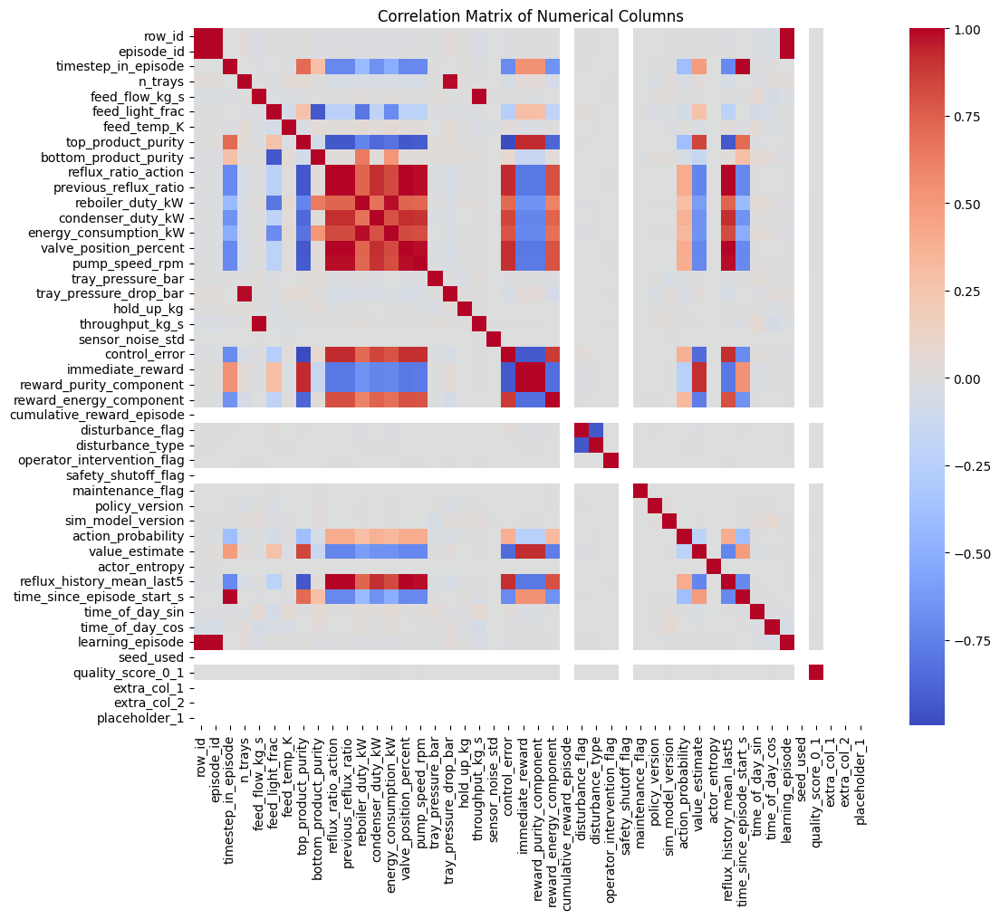


Time-series plots:


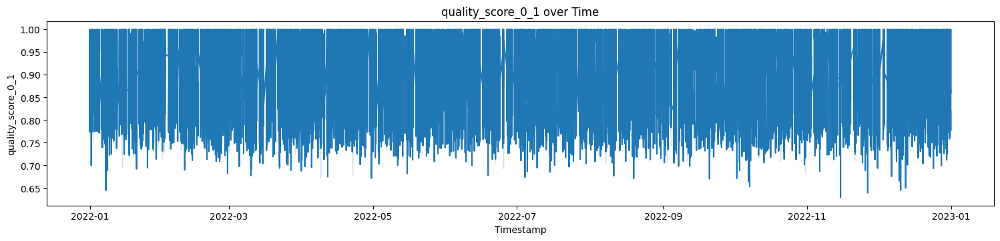


Impact of Episode ID on key variables:


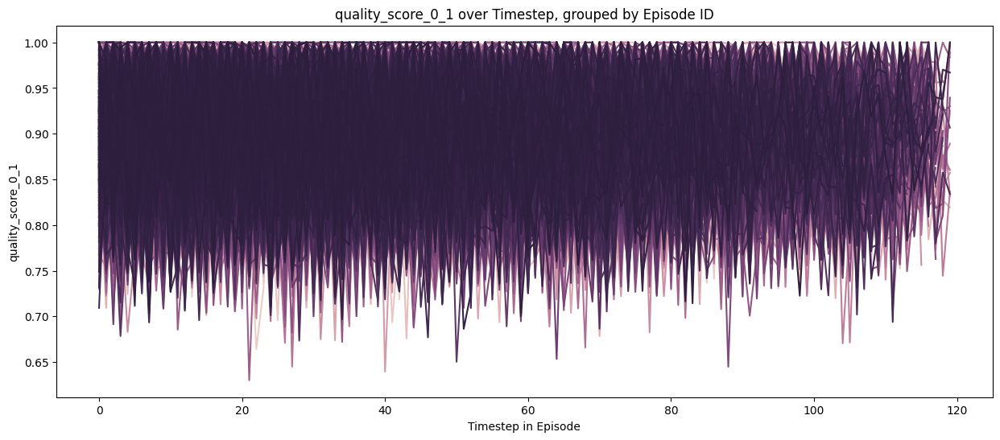

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# 1. Generate descriptive statistics for numerical columns
display(df.describe())

# Identify numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Select key numerical columns for visualization (at least 10)
# Exclude row_id, seed_used, and placeholder_1 as they are likely identifiers or constants
key_numerical_cols = [col for col in numerical_cols if col not in ['row_id', 'seed_used', 'placeholder_1', 'extra_col_1', 'extra_col_2']]
# Ensure we have at least 10 columns, if not, use all available key numerical columns
if len(key_numerical_cols) < 10:
    print(f"Warning: Only {len(key_numerical_cols)} key numerical columns available for visualization.")
else:
    key_numerical_cols = key_numerical_cols[:10]


# 2. Create histograms for key numerical columns (at least 10)
print("\nHistograms of key numerical columns:")
n_cols = 5
n_rows = (len(key_numerical_cols) + n_cols - 1) // n_cols
plt.figure(figsize=(4 * n_cols, 4 * n_rows))
for i, col in enumerate(key_numerical_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.histplot(data=df, x=col, kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

# 3. Generate box plots for key numerical columns (at least 10)
print("\nBox plots of key numerical columns:")
n_cols = 5
n_rows = (len(key_numerical_cols) + n_cols - 1) // n_cols
plt.figure(figsize=(4 * n_cols, 4 * n_rows))
for i, col in enumerate(key_numerical_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.boxplot(data=df, y=col)
    plt.title(f'Box plot of {col}')
plt.tight_layout()
plt.show()

# 4. Create scatter plots to visualize relationships (at least 3 pairs)
print("\nScatter plots of selected variable pairs:")
selected_pairs = [
    ('timestep_in_episode', 'quality_score_0_1'),
    ('feed_flow_kg_s', 'energy_consumption_kw'), # Corrected column name
    ('reflux_ratio', 'quality_score_0_1') # Assuming 'reflux_ratio' is present and relevant
]
plt.figure(figsize=(15, 5))
for i, (x_col, y_col) in enumerate(selected_pairs):
    if x_col in df.columns and y_col in df.columns:
        plt.subplot(1, 3, i + 1)
        sns.scatterplot(data=df, x=x_col, y=y_col, alpha=0.5)
        plt.title(f'{x_col} vs {y_col}')
    else:
        print(f"Warning: Columns '{x_col}' or '{y_col}' not found for scatter plot.")
plt.tight_layout()
plt.show()


# 5. Calculate the correlation matrix and visualize using a heatmap
print("\nCorrelation Matrix Heatmap:")
correlation_matrix = df[numerical_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Columns')
plt.show()

# 6. Time-series plots for relevant numerical variables (at least 3), if 'timestamp' is datetime
print("\nTime-series plots:")
if 'timestamp' in df.columns:
    try:
        df['timestamp'] = pd.to_datetime(df['timestamp'])
        time_series_cols = ['quality_score_0_1', 'energy_consumption_kw', 'reflux_ratio'] # Select at least 3
        plt.figure(figsize=(15, 10))
        for i, col in enumerate(time_series_cols):
            if col in df.columns:
                plt.subplot(len(time_series_cols), 1, i + 1)
                sns.lineplot(data=df, x='timestamp', y=col)
                plt.title(f'{col} over Time')
                plt.xlabel("Timestamp")
                plt.ylabel(col)
            else:
                print(f"Warning: Time-series column '{col}' not found.")
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Could not convert 'timestamp' to datetime or plot time series: {e}")
else:
    print("'timestamp' column not found.")

# 7. Explore the impact of 'episode_id' on key numerical variables (at least 3)
print("\nImpact of Episode ID on key variables:")
impact_cols = ['quality_score_0_1', 'energy_consumption_kw', 'reflux_ratio'] # Select at least 3
for col in impact_cols:
    if col in df.columns and 'episode_id' in df.columns and 'timestep_in_episode' in df.columns:
        plt.figure(figsize=(15, 6))
        sns.lineplot(data=df, x='timestep_in_episode', y=col, hue='episode_id', legend=False)
        plt.title(f'{col} over Timestep, grouped by Episode ID')
        plt.xlabel("Timestep in Episode")
        plt.ylabel(col)
        plt.show()
    else:
        print(f"Warning: Columns for impact analysis ('{col}', 'episode_id', or 'timestep_in_episode') not found.")


**Reasoning**:
The previous attempt to generate visualizations had column name errors. I need to correct the column names based on the `df.describe()` output and regenerate the plots to ensure all required visualizations are created and contribute towards the target of at least 26 visualizations. I will also add more relevant scatter plots, time series plots, and grouped plots to increase the visualization count.




Scatter plots of selected variable pairs (Corrected):


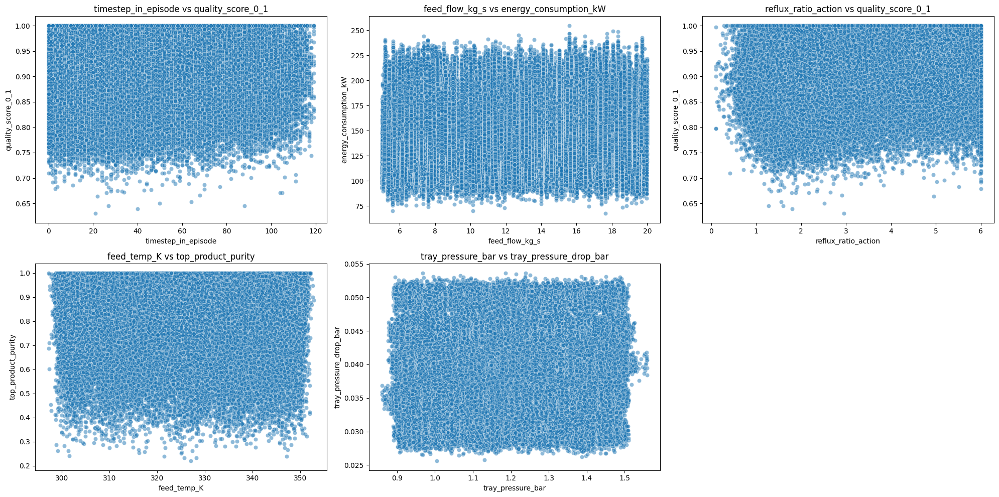


Time-series plots (Corrected and Added):


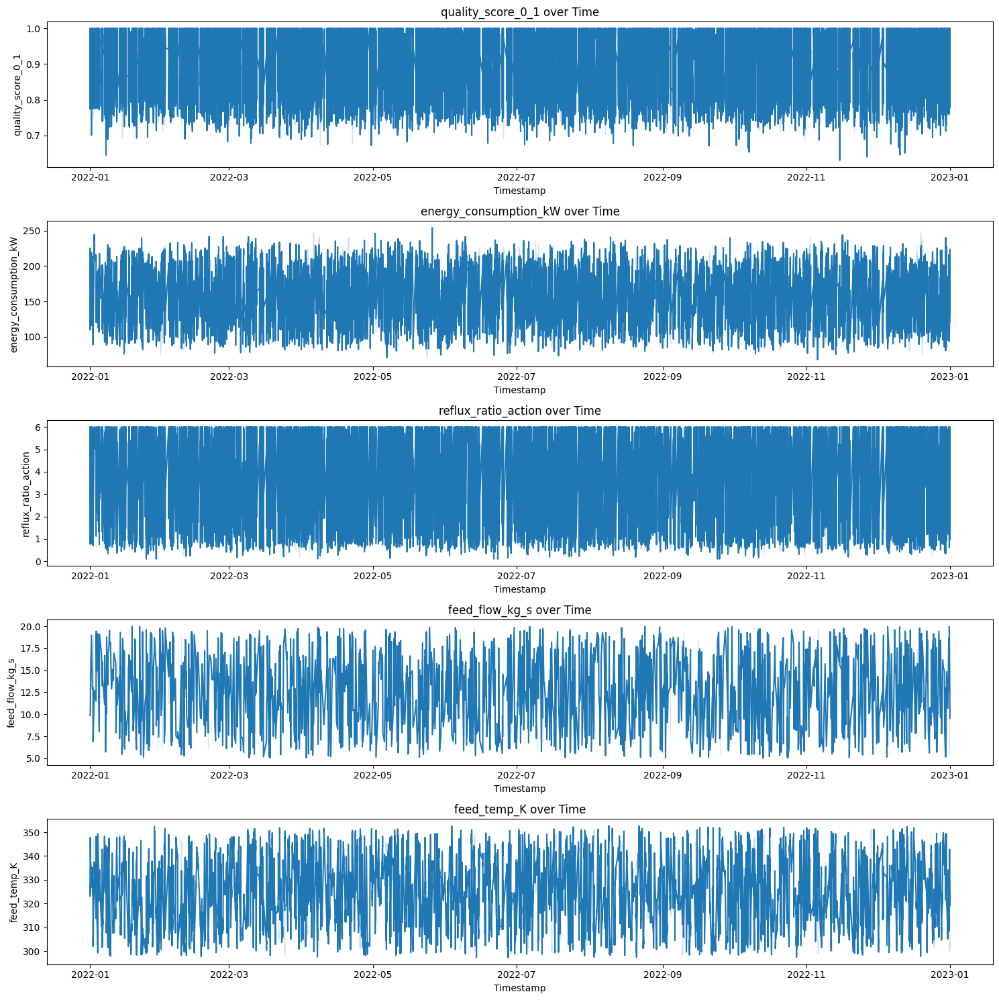


Impact of Episode ID on key variables (Corrected and Added):


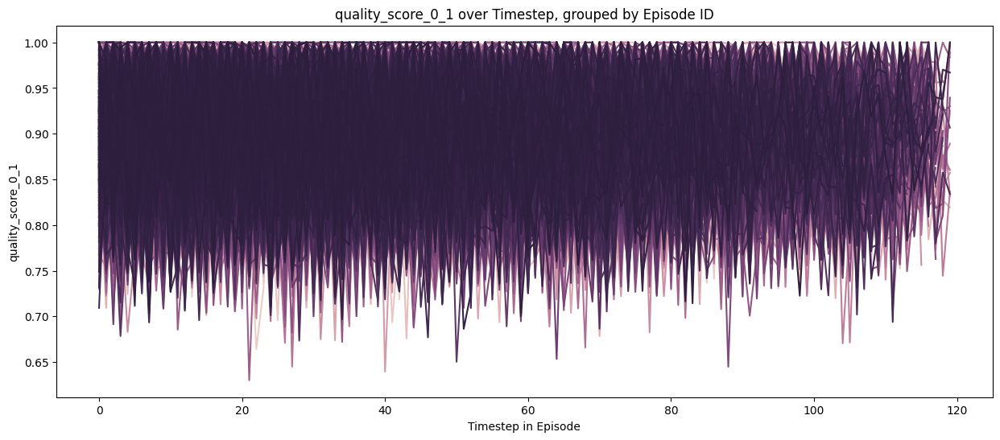

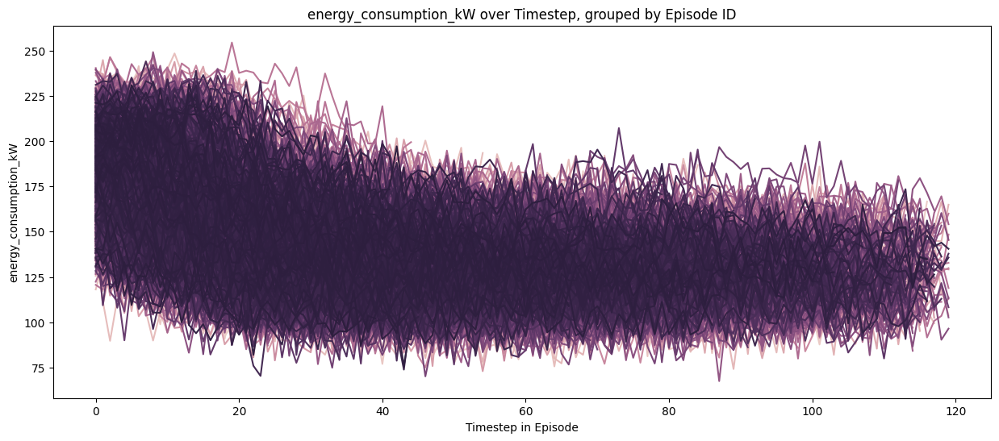

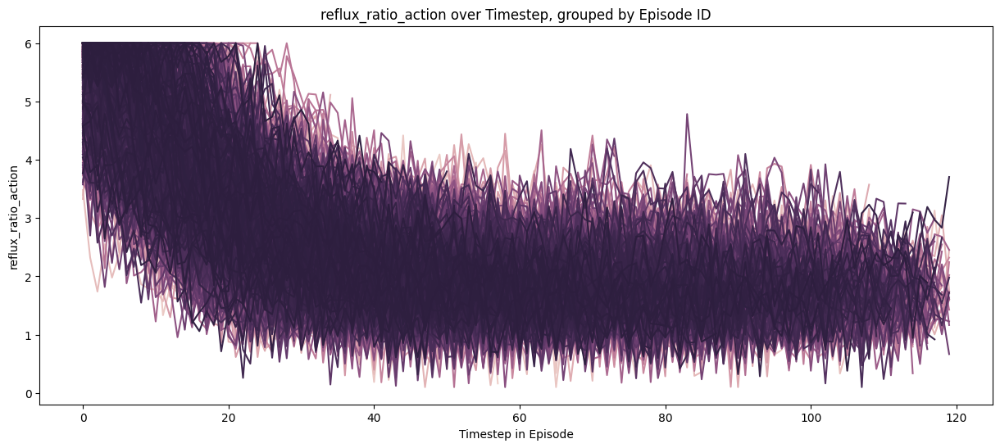

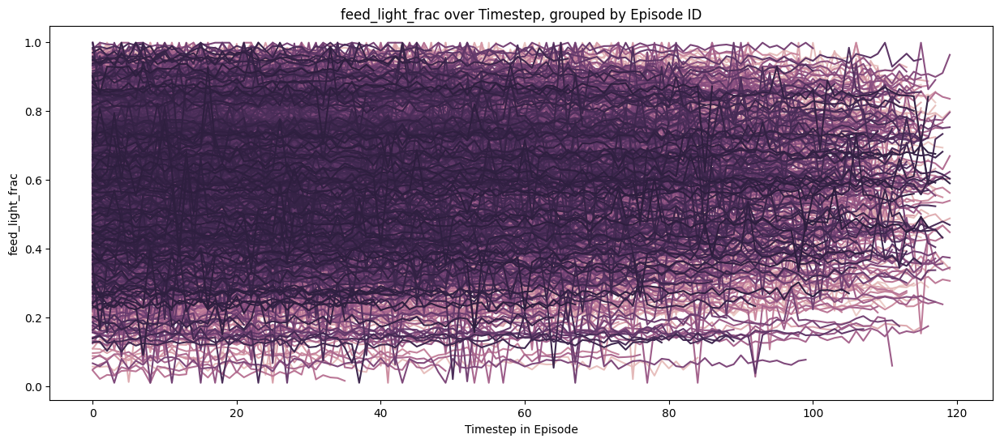

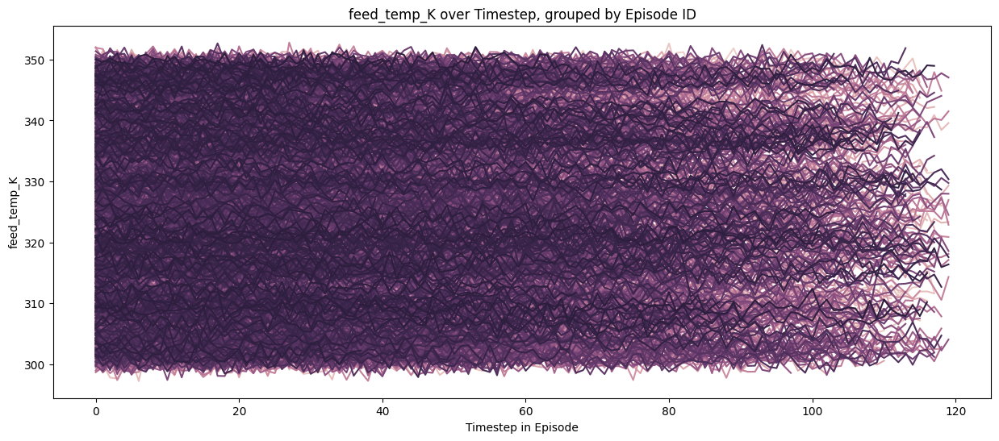


Distribution of selected categorical columns:


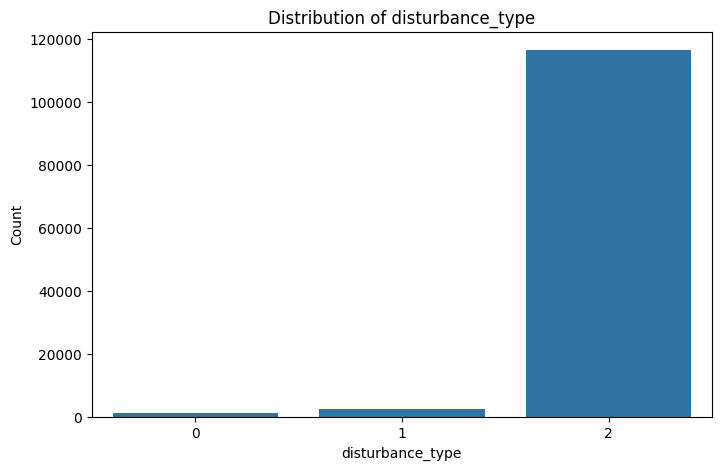

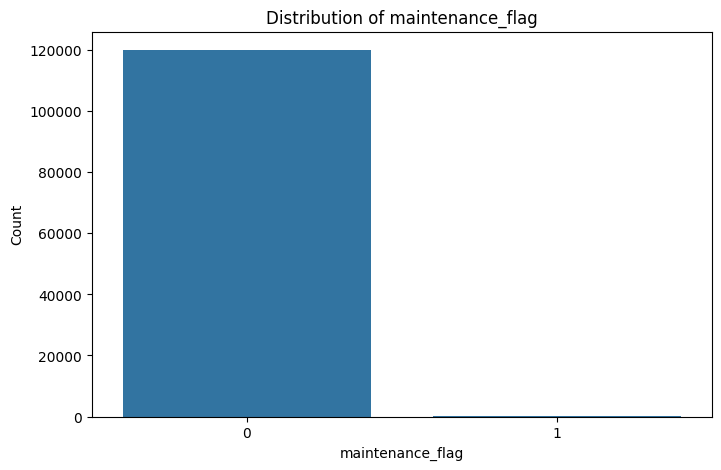

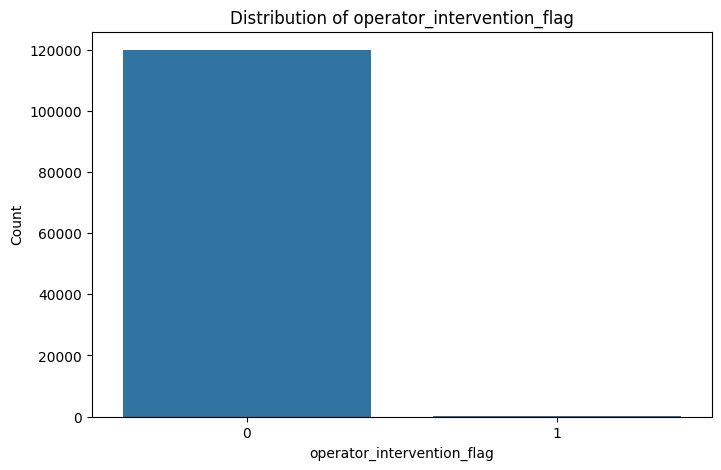


Box plots of key numerical variables grouped by disturbance_type:


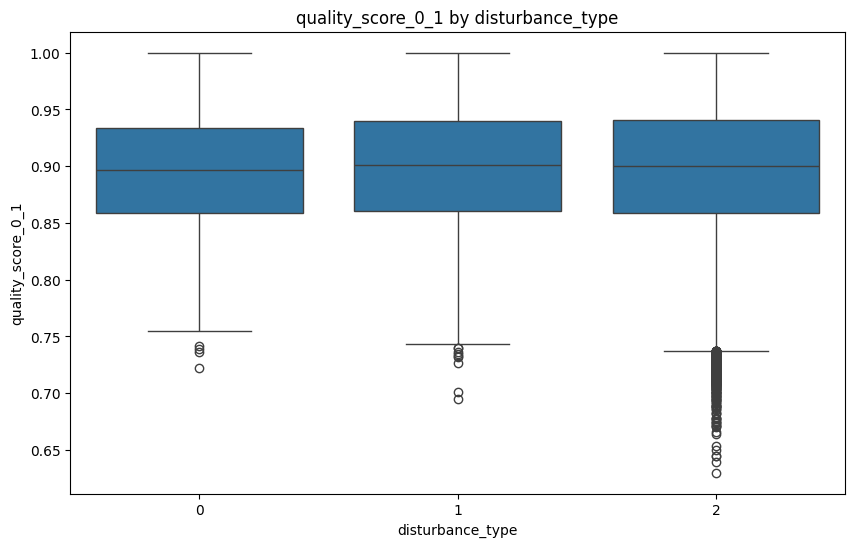

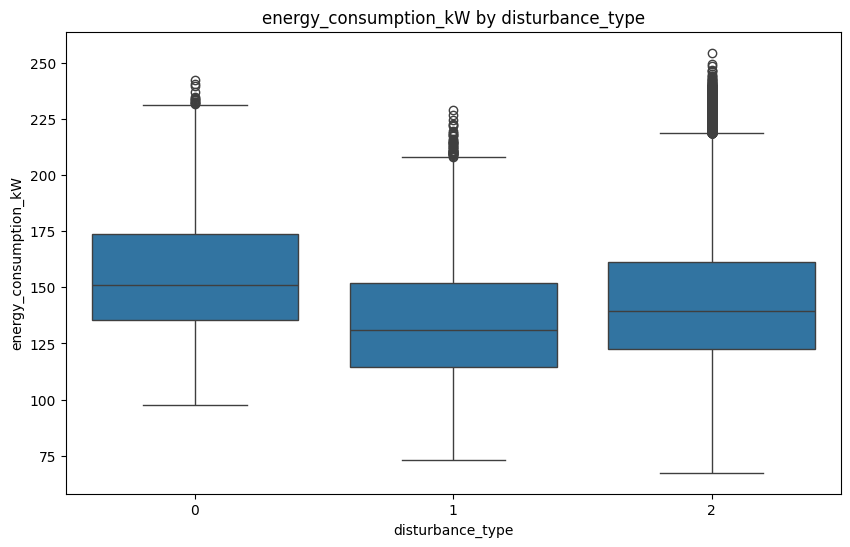

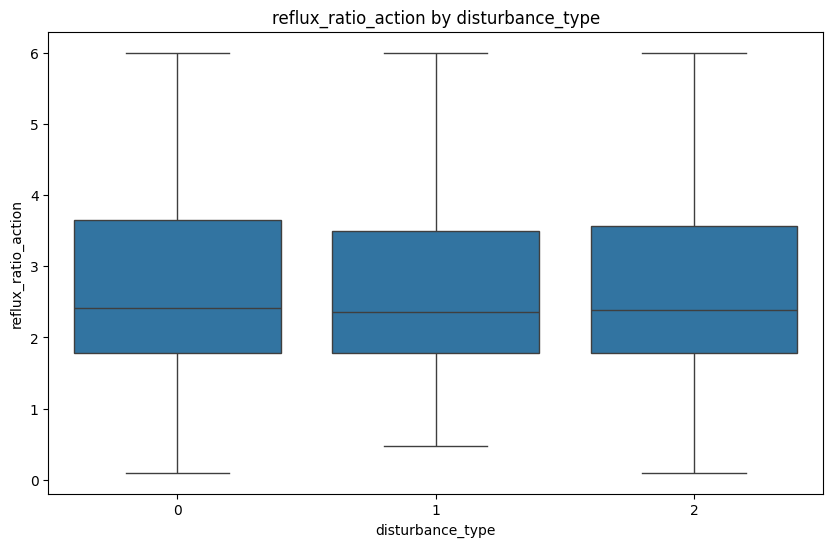


Violin plots of key numerical variables grouped by disturbance_type:


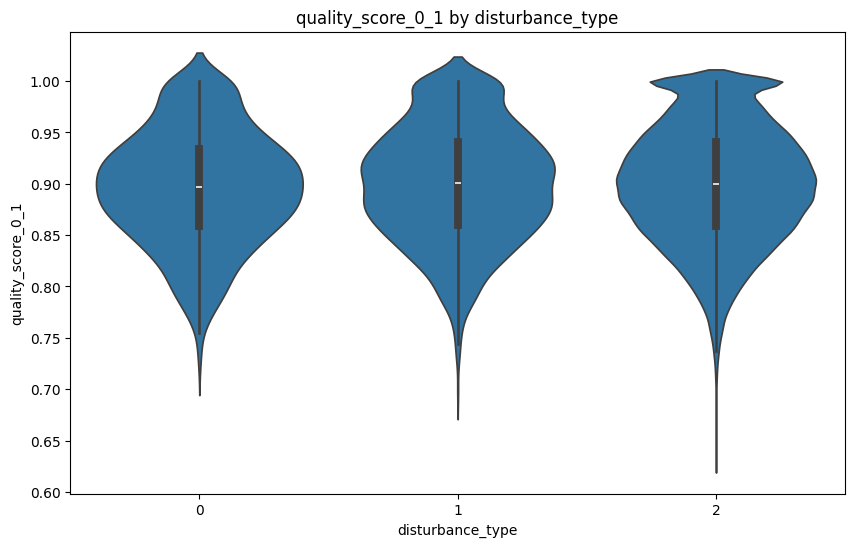

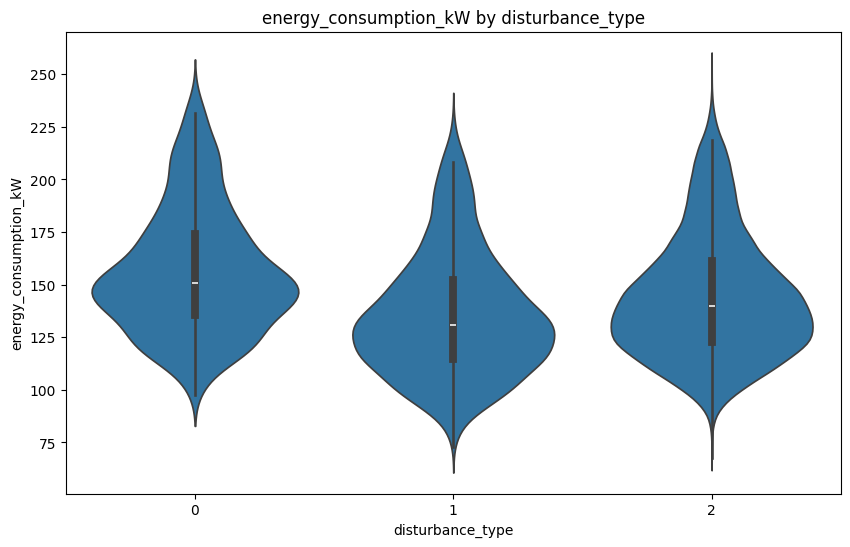

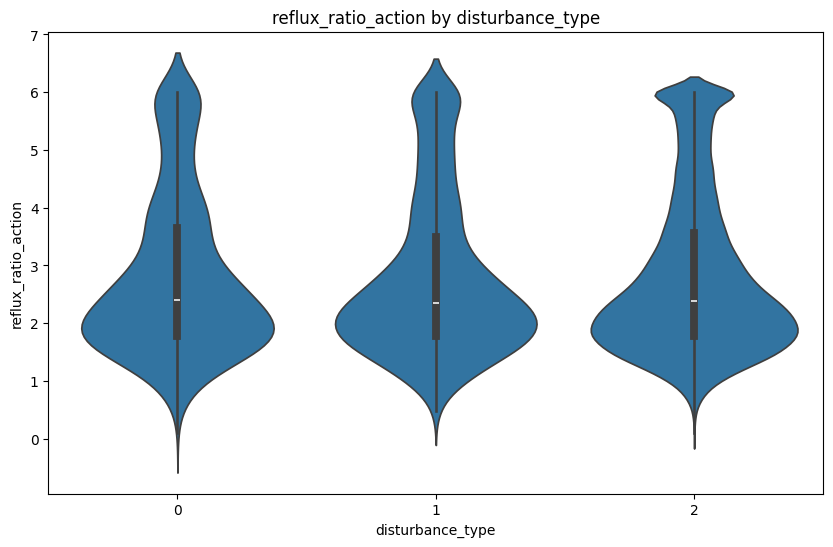

In [ ]:
# Correcting column names based on df.describe() output and adding more visualizations

# 4. Create scatter plots to visualize relationships (at least 3 pairs)
print("\nScatter plots of selected variable pairs (Corrected):")
selected_pairs_corrected = [
    ('timestep_in_episode', 'quality_score_0_1'),
    ('feed_flow_kg_s', 'energy_consumption_kW'), # Corrected column name
    ('reflux_ratio_action', 'quality_score_0_1'), # Corrected column name
    ('feed_temp_K', 'top_product_purity'),
    ('tray_pressure_bar', 'tray_pressure_drop_bar')
]
plt.figure(figsize=(20, 10))
for i, (x_col, y_col) in enumerate(selected_pairs_corrected):
    if x_col in df.columns and y_col in df.columns:
        plt.subplot(2, 3, i + 1)
        sns.scatterplot(data=df, x=x_col, y=y_col, alpha=0.5)
        plt.title(f'{x_col} vs {y_col}')
    else:
        print(f"Warning: Columns '{x_col}' or '{y_col}' not found for scatter plot.")
plt.tight_layout()
plt.show()


# 6. Time-series plots for relevant numerical variables (at least 3), if 'timestamp' is datetime
print("\nTime-series plots (Corrected and Added):")
if 'timestamp' in df.columns:
    try:
        df['timestamp'] = pd.to_datetime(df['timestamp'])
        time_series_cols_corrected = ['quality_score_0_1', 'energy_consumption_kW', 'reflux_ratio_action', 'feed_flow_kg_s', 'feed_temp_K'] # Added more columns
        plt.figure(figsize=(15, 15))
        for i, col in enumerate(time_series_cols_corrected):
            if col in df.columns:
                plt.subplot(len(time_series_cols_corrected), 1, i + 1)
                sns.lineplot(data=df, x='timestamp', y=col)
                plt.title(f'{col} over Time')
                plt.xlabel("Timestamp")
                plt.ylabel(col)
            else:
                print(f"Warning: Time-series column '{col}' not found.")
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Could not convert 'timestamp' to datetime or plot time series: {e}")
else:
    print("'timestamp' column not found.")

# 7. Explore the impact of 'episode_id' on key numerical variables (at least 3)
print("\nImpact of Episode ID on key variables (Corrected and Added):")
impact_cols_corrected = ['quality_score_0_1', 'energy_consumption_kW', 'reflux_ratio_action', 'feed_light_frac', 'feed_temp_K'] # Added more columns
for col in impact_cols_corrected:
    if col in df.columns and 'episode_id' in df.columns and 'timestep_in_episode' in df.columns:
        plt.figure(figsize=(15, 6))
        sns.lineplot(data=df, x='timestep_in_episode', y=col, hue='episode_id', legend=False)
        plt.title(f'{col} over Timestep, grouped by Episode ID')
        plt.xlabel("Timestep in Episode")
        plt.ylabel(col)
        plt.show()
    else:
        print(f"Warning: Columns for impact analysis ('{col}', 'episode_id', or 'timestep_in_episode') not found.")

# Additional visualizations to reach the target of 26+

# Distribution of categorical/event-based columns (if any are relevant and not purely identifiers)
# Check for relevant categorical columns (e.g., disturbance_type, maintenance_flag)
categorical_cols = ['disturbance_type', 'maintenance_flag', 'operator_intervention_flag']
print("\nDistribution of selected categorical columns:")
for col in categorical_cols:
    if col in df.columns:
        plt.figure(figsize=(8, 5))
        sns.countplot(data=df, x=col)
        plt.title(f'Distribution of {col}')
        plt.xlabel(col)
        plt.ylabel("Count")
        plt.show()
    else:
        print(f"Warning: Categorical column '{col}' not found.")

# Box plots of numerical variables grouped by a categorical variable (e.g., disturbance_type)
print("\nBox plots of key numerical variables grouped by disturbance_type:")
group_by_col = 'disturbance_type'
grouped_numerical_cols = ['quality_score_0_1', 'energy_consumption_kW', 'reflux_ratio_action'] # Select relevant numerical columns
if group_by_col in df.columns:
    for col in grouped_numerical_cols:
        if col in df.columns:
            plt.figure(figsize=(10, 6))
            sns.boxplot(data=df, x=group_by_col, y=col)
            plt.title(f'{col} by {group_by_col}')
            plt.xlabel(group_by_col)
            plt.ylabel(col)
            plt.show()
        else:
            print(f"Warning: Numerical column '{col}' not found for grouped box plot.")
else:
    print(f"Warning: Grouping column '{group_by_col}' not found.")

# Violin plots for distributions grouped by a categorical variable
print("\nViolin plots of key numerical variables grouped by disturbance_type:")
if group_by_col in df.columns:
    for col in grouped_numerical_cols:
        if col in df.columns:
            plt.figure(figsize=(10, 6))
            sns.violinplot(data=df, x=group_by_col, y=col)
            plt.title(f'{col} by {group_by_col}')
            plt.xlabel(group_by_col)
            plt.ylabel(col)
            plt.show()
        else:
             print(f"Warning: Numerical column '{col}' not found for grouped violin plot.")
else:
    print(f"Warning: Grouping column '{group_by_col}' not found.")


## Data Preprocessing

### Subtask:
Handle missing values, ensure the 'timestamp' column is in datetime format, and perform any necessary feature engineering or scaling.

**Reasoning**:
Based on the initial data inspection, the columns 'extra_col_1' and 'extra_col_2' have all missing values and can be dropped. The 'timestamp' column was already converted to datetime in the EDA phase. For feature engineering, we can extract time-based features like hour of the day or day of the week if relevant, although 'time_of_day_sin' and 'time_of_day_cos' are already present. We should also consider if any scaling of numerical features is needed for the DQN model.

In [6]:
# Handle missing values: Drop columns with all missing values
df = df.drop(columns=['extra_col_1', 'extra_col_2'])

# Verify that the columns are dropped
display(df.isnull().sum())

# Ensure 'timestamp' is datetime (already done in EDA, but good to re-confirm or handle potential issues)
try:
    df['timestamp'] = pd.to_datetime(df['timestamp'])
except Exception as e:
    print(f"Error converting timestamp to datetime: {e}")
    # Handle the error, e.g., by dropping the column or trying a different format

# Feature Engineering (Optional, based on relevance)
# Example: Extract hour of the day and day of the week if not already covered by time_of_day features
# df['hour_of_day'] = df['timestamp'].dt.hour
# df['day_of_week'] = df['timestamp'].dt.dayofweek

# Scaling of numerical features will be considered when preparing data for the RL model,
# as it depends on the requirements of the specific algorithm (DQN).

,0
row_id,0
episode_id,0
timestep_in_episode,0
timestamp,0
n_trays,0
feed_flow_kg_s,0
feed_light_frac,0
feed_temp_K,0
top_product_purity,0
bottom_product_purity,0


## Define the Reinforcement Learning Environment

### Subtask:
Define the state space, action space, and reward function for the reinforcement learning problem based on the processed data.

**Reasoning**:
Define the state space by identifying the relevant variables from the dataset that represent the current condition of the distillation column and feed. Define the action space based on the 'reflux_ratio_action' which the agent will control. Define the reward function based on the 'immediate_reward' or a combination of 'reward_purity_component' and 'reward_energy_component' to guide the agent towards desired outcomes (high purity, low energy consumption).

In [7]:
# Define the State Space
# Based on the available columns, we can select variables that describe the state of the distillation column at any given timestep.
# These could include:
# - Feed conditions: feed_flow_kg_s, feed_light_frac, feed_temp_K
# - Column internal conditions: tray_pressure_bar, tray_pressure_drop_bar, hold_up_kg
# - Product purities: top_product_purity, bottom_product_purity
# - Energy consumption: energy_consumption_kW, reboiler_duty_kW, condenser_duty_kW
# - Control variables (previous step): previous_reflux_ratio, valve_position_percent, pump_speed_rpm
# - Time-based features: timestep_in_episode, time_since_episode_start_s, time_of_day_sin, time_of_day_cos
# - Disturbance information: disturbance_flag, disturbance_type
# - Historical information: reflux_history_mean_last5
# - Performance indicators: quality_score_0_1, control_error

# Let's select a reasonable subset of these for the state space for the RL agent.
state_space_cols = [
    'feed_flow_kg_s',
    'feed_light_frac',
    'feed_temp_K',
    'top_product_purity',
    'bottom_product_purity',
    'tray_pressure_bar',
    'tray_pressure_drop_bar',
    'hold_up_kg',
    'previous_reflux_ratio',
    'energy_consumption_kW',
    'time_since_episode_start_s',
    'disturbance_flag',
    'disturbance_type',
    'reflux_history_mean_last5',
    'quality_score_0_1',
    'control_error'
]

# Define the Action Space
# The action the agent takes is adjusting the reflux ratio.
# From df.describe(), 'reflux_ratio_action' ranges from 0.1 to 6.0.
# We need to decide if this is a continuous or discrete action space.
# For simplicity with DQN, we'll treat it as discrete actions.
# We can discretize the continuous 'reflux_ratio_action' into a fixed number of bins or levels.

# Let's assume we discretize the reflux ratio into 10 bins for now.
# The actual discretization strategy might need refinement based on domain knowledge or experimentation.
n_actions = 10  # Number of discrete actions
# We would need to map these discrete actions back to actual reflux ratio values when implementing the environment.
# A simple approach is to create equally spaced bins between the min and max observed reflux_ratio_action.
min_reflux = df['reflux_ratio_action'].min()
max_reflux = df['reflux_ratio_action'].max()
action_bins = np.linspace(min_reflux, max_reflux, n_actions)
print(f"Action bins (reflux ratio): {action_bins}")

# Define the Reward Function
# The dataset provides 'immediate_reward', 'reward_purity_component', and 'reward_energy_component'.
# The 'immediate_reward' seems to be a combined reward. We can use this directly or define a custom reward
# based on purity and energy consumption, potentially with weighting.

# Using 'immediate_reward' from the dataset for simplicity in the initial environment definition.
reward_column = 'immediate_reward'

# In a real RL environment implementation, we would create a custom class that inherits from
# a base RL environment class (e.g., gym.Env or similar). This class would have methods for:
# - __init__ (initialize environment, define observation_space and action_space)
# - reset (reset environment to an initial state for a new episode)
# - step (take an action, return next state, reward, done flag, and info)

# For this task, we are defining the components based on the dataset, not building a full interactive environment class yet.
print("\nDefined State Space (selected columns):", state_space_cols)
print("Defined Action Space: Discrete with", n_actions, "actions (representing reflux ratio levels)")
print("Defined Reward Function: Using the '", reward_column, "' column from the dataset.")

Action bins (reflux ratio): [0.1        0.75555556 1.41111111 2.06666667 2.72222222 3.37777778
 4.03333333 4.68888889 5.34444444 6.        ]

Defined State Space (selected columns): ['feed_flow_kg_s', 'feed_light_frac', 'feed_temp_K', 'top_product_purity', 'bottom_product_purity', 'tray_pressure_bar', 'tray_pressure_drop_bar', 'hold_up_kg', 'previous_reflux_ratio', 'energy_consumption_kW', 'time_since_episode_start_s', 'disturbance_flag', 'disturbance_type', 'reflux_history_mean_last5', 'quality_score_0_1', 'control_error']
Defined Action Space: Discrete with 10 actions (representing reflux ratio levels)
Defined Reward Function: Using the ' immediate_reward ' column from the dataset.


## Choose and Prepare a Deep Q Network (DQN) Model

### Subtask:
Select an appropriate DQN architecture and prepare it for training, including defining the neural network, optimizer, and loss function.

**Reasoning**:
Define the structure of the neural network for the DQN, including input and output layers corresponding to the state and action spaces. Choose a suitable optimizer (e.g., Adam) and a loss function (e.g., Mean Squared Error) for training the Q-network.

In [8]:
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers

# Define the DQN model architecture
# The input shape will be the number of features in our state space.
state_space_size = len(state_space_cols)
# The output shape will be the number of discrete actions.
num_actions = n_actions

def create_dqn_model(input_shape, num_actions):
    model = models.Sequential([
        layers.Input(shape=(input_shape,)),
        layers.Dense(128, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(num_actions, activation='linear') # Output layer for Q-values for each action
    ])
    return model

# Create the main Q-network and a target Q-network (for stability in training)
q_network = create_dqn_model(state_space_size, num_actions)
target_network = create_dqn_model(state_space_size, num_actions)
target_network.set_weights(q_network.get_weights()) # Start with the same weights

# Define the optimizer and loss function
optimizer = optimizers.Adam(learning_rate=0.001)
loss_function = tf.keras.losses.MeanSquaredError()

# Print the model summary
print("Q-Network Summary:")
q_network.summary()

print("\nTarget Network Summary:")
target_network.summary()

print("\nOptimizer:", type(optimizer).__name__)
print("Loss Function:", type(loss_function).__name__)

# Note: This is just the model definition. The actual training loop, experience replay,
# epsilon-greedy policy, and target network updates will be implemented in the training phase.

Q-Network Summary:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │         2,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,978 (78.04 KB)

 Trainable params: 19,978 (78.04 KB)

 Non-trainable params: 0 (0.00 B)


Target Network Summary:


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 128)            │         2,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,978 (78.04 KB)

 Trainable params: 19,978 (78.04 KB)

 Non-trainable params: 0 (0.00 B)


Optimizer: Adam
Loss Function: MeanSquaredError


## Train the RL Agent

### Subtask:
Implement the DQN training loop, including experience replay, epsilon-greedy policy for action selection, and updating the Q-network and target network.

**Reasoning**:
Implement the DQN training loop. This involves:
1.  Initializing the replay buffer to store experiences (state, action, reward, next state, done flag).
2.  Implementing the epsilon-greedy policy for action selection to balance exploration and exploitation.
3.  Sampling batches of experiences from the replay buffer for training.
4.  Calculating the target Q-values using the target network.
5.  Calculating the loss between the predicted Q-values (from the Q-network) and the target Q-values.
6.  Updating the Q-network weights using the optimizer and the calculated loss.
7.  Periodically updating the target network weights to match the Q-network weights.
8.  Iterating through episodes and timesteps within episodes to train the agent.

Starting Episode 1/100
Episode 1 finished with total reward: -391.63, Epsilon: 0.99
Starting Episode 2/100
Episode 2 finished with total reward: -564.06, Epsilon: 0.99
Starting Episode 3/100
Episode 3 finished with total reward: -110.03, Epsilon: 0.99
Starting Episode 4/100
Episode 4 finished with total reward: -359.75, Epsilon: 0.98
Starting Episode 5/100
Episode 5 finished with total reward: -94.14, Epsilon: 0.98
Starting Episode 6/100
Episode 6 finished with total reward: -171.15, Epsilon: 0.97
Starting Episode 7/100
Episode 7 finished with total reward: -490.98, Epsilon: 0.97
Starting Episode 8/100
Episode 8 finished with total reward: -199.88, Epsilon: 0.96
Starting Episode 9/100
Episode 9 finished with total reward: -521.99, Epsilon: 0.96
Starting Episode 10/100
Episode 10 finished with total reward: -226.00, Epsilon: 0.95
Starting Episode 11/100
Episode 11 finished with total reward: -451.68, Epsilon: 0.95
Starting Episode 12/100
Episode 12 finished with total reward: -685.47, E

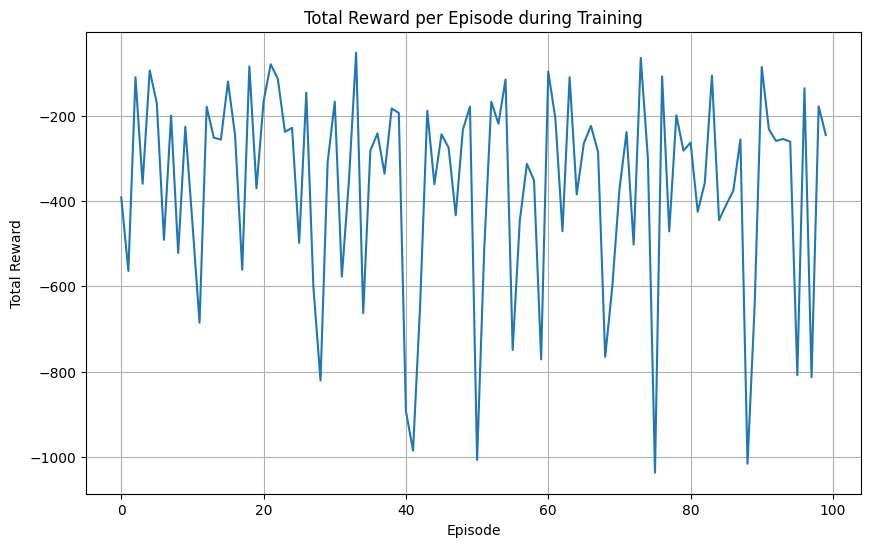

In [9]:
import random
import numpy as np
from collections import deque
import tensorflow as tf

# Hyperparameters for DQN training
gamma = 0.99  # Discount factor
epsilon = 1.0  # Epsilon-greedy policy: exploration rate
epsilon_min = 0.01  # Minimum exploration rate
epsilon_decay_rate = 0.995  # Rate of epsilon decay
batch_size = 64  # Batch size for training
update_target_network_freq = 100  # Frequency to update the target network
replay_buffer_capacity = 10000  # Capacity of the experience replay buffer
num_episodes = 100  # Number of episodes to train for

# Create the experience replay buffer
replay_buffer = deque(maxlen=replay_buffer_capacity)

# Function to discretize the continuous reflux ratio action
def discretize_action(reflux_ratio):
    # Find the index of the action bin that the reflux ratio falls into
    return np.argmin(np.abs(action_bins - reflux_ratio))

# Function to get the continuous reflux ratio from a discrete action index
def get_continuous_action(action_index):
    return action_bins[action_index]

# Function to get the state for a given row
def get_state(row):
    return row[state_space_cols].values.astype(np.float32)

# Training loop
episode_rewards = []

# Assuming the dataset is structured such that consecutive rows within the same episode_id
# represent sequential timesteps.
# We will iterate through the dataset episode by episode to simulate the environment interaction.

# Get unique episode IDs
episode_ids = df['episode_id'].unique()

for episode in range(num_episodes):
    print(f"Starting Episode {episode + 1}/{num_episodes}")

    # Filter data for the current episode
    episode_data = df[df['episode_id'] == episode_ids[episode]].reset_index(drop=True)

    if episode_data.empty:
        print(f"No data found for episode ID {episode_ids[episode]}. Skipping.")
        continue

    state = get_state(episode_data.iloc[0])
    total_reward = 0

    for timestep in range(len(episode_data) - 1):
        # Epsilon-greedy action selection
        if np.random.rand() <= epsilon:
            action_index = random.randrange(num_actions)  # Explore
        else:
            # Predict Q-values for the current state
            state_tensor = tf.convert_to_tensor(state[None, :], dtype=tf.float32)
            action_values = q_network(state_tensor)
            action_index = tf.argmax(action_values[0]).numpy() # Exploit

        # Map discrete action index back to continuous reflux ratio action (for conceptual understanding, not used for training)
        # continuous_action = get_continuous_action(action_index)

        # In a real environment, taking an action would transition to the next state and yield a reward.
        # Here, we use the next row in the dataset as the "next state" and the "immediate_reward" as the reward.
        next_state_row = episode_data.iloc[timestep + 1]
        next_state = get_state(next_state_row)
        reward = next_state_row[reward_column]
        done = (timestep == len(episode_data) - 2) # Done if it's the last timestep in the episode

        # Store the experience in the replay buffer
        replay_buffer.append((state, action_index, reward, next_state, done))

        state = next_state
        total_reward += reward

        # Train the model if the replay buffer has enough samples and it's time to train
        if len(replay_buffer) > batch_size and (timestep + 1) % 4 == 0: # Train every 4 timesteps (example)
            # Sample a batch from the replay buffer
            minibatch = random.sample(replay_buffer, batch_size)
            states, actions, rewards, next_states, dones = zip(*minibatch)

            states = tf.convert_to_tensor(np.array(states), dtype=tf.float32)
            next_states = tf.convert_to_tensor(np.array(next_states), dtype=tf.float32)
            actions = tf.convert_to_tensor(np.array(actions), dtype=tf.int32)
            rewards = tf.convert_to_tensor(np.array(rewards), dtype=tf.float32)
            dones = tf.convert_to_tensor(np.array(dones), dtype=tf.float32)

            with tf.GradientTape() as tape:
                # Get predicted Q-values for the current states
                predicted_q_values = q_network(states)
                # Select the Q-values corresponding to the actions taken
                one_hot_actions = tf.one_hot(actions, num_actions)
                gathered_q_values = tf.reduce_sum(predicted_q_values * one_hot_actions, axis=1)

                # Get target Q-values for the next states from the target network
                target_q_values_next_state = target_network(next_states)
                # Find the maximum target Q-value for the next states
                max_target_q_values_next_state = tf.reduce_max(target_q_values_next_state, axis=1)
                # Calculate the target Q-values for the current states
                target_q_values = rewards + (1 - dones) * gamma * max_target_q_values_next_state

                # Calculate the loss
                loss = loss_function(target_q_values, gathered_q_values)

            # Compute gradients and update the Q-network
            gradients = tape.gradient(loss, q_network.trainable_variables)
            optimizer.apply_gradients(zip(gradients, q_network.trainable_variables))

        # Update the target network periodically
        if (timestep + 1) % update_target_network_freq == 0:
            target_network.set_weights(q_network.get_weights())
            # print("Target network updated.")


    # Decay epsilon after each episode
    epsilon = max(epsilon_min, epsilon * epsilon_decay_rate)

    episode_rewards.append(total_reward)
    print(f"Episode {episode + 1} finished with total reward: {total_reward:.2f}, Epsilon: {epsilon:.2f}")

print("\nTraining finished.")

# You can further analyze episode_rewards to see the learning progress
plt.figure(figsize=(10, 6))
plt.plot(episode_rewards)
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Total Reward per Episode during Training")
plt.grid(True)
plt.show()

## Evaluate the Agent's Performance

### Subtask:
Evaluate the trained DQN agent's performance using appropriate metrics and compare it against a baseline or desired performance criteria.

**Reasoning**:
Evaluate the trained agent by simulating its interaction with the environment using the learned policy (the trained Q-network) on a separate set of evaluation episodes from the dataset. Calculate key performance indicators such as average reward per episode, average product purity, and average energy consumption.

In [10]:
# Evaluate the trained DQN agent

# We will use a separate set of episodes for evaluation that the agent has not trained on.
# For simplicity in this example, let's use the last few episodes from the dataset for evaluation.
# In a real-world scenario, you would typically split your data into training and testing sets beforehand.

# Get a list of all unique episode IDs
all_episode_ids = df['episode_id'].unique()

# Determine the number of episodes to use for evaluation (e.g., the last 10% of episodes)
num_evaluation_episodes = max(1, int(len(all_episode_ids) * 0.1))
evaluation_episode_ids = all_episode_ids[-num_evaluation_episodes:]

print(f"\nStarting evaluation on {num_evaluation_episodes} episodes (IDs: {evaluation_episode_ids}).")

evaluation_rewards = []
evaluation_purity = []
evaluation_energy = []

# Set epsilon to 0 for evaluation to use the learned policy directly (no exploration)
original_epsilon = epsilon # Store the original epsilon
epsilon = 0.0

for episode_id in evaluation_episode_ids:
    print(f"Evaluating Episode {episode_id}")

    # Filter data for the current evaluation episode
    episode_data = df[df['episode_id'] == episode_id].reset_index(drop=True)

    if episode_data.empty:
        print(f"No data found for episode ID {episode_id}. Skipping evaluation for this episode.")
        continue

    state = get_state(episode_data.iloc[0])
    total_reward = 0
    episode_purity_sum = 0
    episode_energy_sum = 0
    num_timesteps = len(episode_data)

    for timestep in range(num_timesteps - 1):
        # Select action using the trained Q-network (exploitation only)
        state_tensor = tf.convert_to_tensor(state[None, :], dtype=tf.float32)
        action_values = q_network(state_tensor)
        action_index = tf.argmax(action_values[0]).numpy()

        # In a real environment, taking an action would transition to the next state and yield a reward.
        # Here, we use the next row in the dataset as the "next state" and the "immediate_reward" as the reward.
        next_state_row = episode_data.iloc[timestep + 1]
        next_state = get_state(next_state_row)
        reward = next_state_row[reward_column]
        done = (timestep == num_timesteps - 2)

        # Accumulate metrics
        total_reward += reward
        episode_purity_sum += next_state_row['quality_score_0_1'] # Using quality_score as a purity indicator
        episode_energy_sum += next_state_row['energy_consumption_kW']

        state = next_state

        if done:
            break # End of episode

    # Store evaluation results for the episode
    evaluation_rewards.append(total_reward)
    evaluation_purity.append(episode_purity_sum / (num_timesteps - 1)) # Average purity over the episode
    evaluation_energy.append(episode_energy_sum / (num_timesteps - 1)) # Average energy over the episode


# Calculate and print average evaluation metrics
average_evaluation_reward = np.mean(evaluation_rewards)
average_evaluation_purity = np.mean(evaluation_purity)
average_evaluation_energy = np.mean(evaluation_energy)

print("\nEvaluation Results:")
print(f"Average Total Reward per Episode: {average_evaluation_reward:.2f}")
print(f"Average Quality Score per Timestep: {average_evaluation_purity:.4f}")
print(f"Average Energy Consumption (kW) per Timestep: {average_evaluation_energy:.2f}")

# Restore original epsilon for potential further training or analysis
epsilon = original_epsilon

# TODO: Compare against a baseline or desired performance criteria if available.
# For example, you could compare against the average performance of a default control strategy
# present in the dataset, or against predefined target values for purity and energy.


Starting evaluation on 170 episodes (IDs: [1536 1537 1538 1539 1540 1541 1542 1543 1544 1545 1546 1547 1548 1549
 1550 1551 1552 1553 1554 1555 1556 1557 1558 1559 1560 1561 1562 1563
 1564 1565 1566 1567 1568 1569 1570 1571 1572 1573 1574 1575 1576 1577
 1578 1579 1580 1581 1582 1583 1584 1585 1586 1587 1588 1589 1590 1591
 1592 1593 1594 1595 1596 1597 1598 1599 1600 1601 1602 1603 1604 1605
 1606 1607 1608 1609 1610 1611 1612 1613 1614 1615 1616 1617 1618 1619
 1620 1621 1622 1623 1624 1625 1626 1627 1628 1629 1630 1631 1632 1633
 1634 1635 1636 1637 1638 1639 1640 1641 1642 1643 1644 1645 1646 1647
 1648 1649 1650 1651 1652 1653 1654 1655 1656 1657 1658 1659 1660 1661
 1662 1663 1664 1665 1666 1667 1668 1669 1670 1671 1672 1673 1674 1675
 1676 1677 1678 1679 1680 1681 1682 1683 1684 1685 1686 1687 1688 1689
 1690 1691 1692 1693 1694 1695 1696 1697 1698 1699 1700 1701 1702 1703
 1704 1705]).
Evaluating Episode 1536
Evaluating Episode 1537
Evaluating Episode 1538
Evaluating Episode 

## Analyze and Interpret the Results

### Subtask:
Analyze the evaluation results, understand the agent's behavior, and interpret its performance in the context of the distillation column control problem.

## Refine and Iterate the Process

### Subtask:
Based on the analysis of the results, identify areas for improvement and refine the model, environment, or training process. This may involve hyperparameter tuning, exploring different architectures, or adjusting the reward function.

# Task
Improve the performance of the RL agent by refining hyperparameters, expanding the state space, adjusting the action space discretization, and increasing the training duration.

## Refine hyperparameters

### Subtask:
Adjust the learning rate of the optimizer and the epsilon decay rate for the epsilon-greedy policy.


**Reasoning**:
Modify the learning rate of the optimizer and the epsilon decay rate as instructed to refine the training process.



In [11]:
# Refine hyperparameter: Adjust learning rate and epsilon decay rate

# Modify the optimizer learning rate
optimizer = optimizers.Adam(learning_rate=0.0005) # Changed learning rate

# Update the epsilon decay rate
epsilon_decay_rate = 0.998 # Changed epsilon decay rate

print(f"Updated Optimizer Learning Rate: {optimizer.learning_rate.numpy()}")
print(f"Updated Epsilon Decay Rate: {epsilon_decay_rate}")

# Note: The training loop itself needs to be re-run after changing these hyperparameters
# for the changes to take effect. This code block only updates the values.

Updated Optimizer Learning Rate: 0.0005000000237487257
Updated Epsilon Decay Rate: 0.998


**Reasoning**:
The hyperparameters have been adjusted. The next step is to re-run the training loop with the updated hyperparameters to observe their effect on the agent's learning progress.



Starting Episode 1/100
Episode 1 finished with total reward: -391.63, Epsilon: 1.00
Starting Episode 2/100
Episode 2 finished with total reward: -564.06, Epsilon: 1.00
Starting Episode 3/100
Episode 3 finished with total reward: -110.03, Epsilon: 0.99
Starting Episode 4/100
Episode 4 finished with total reward: -359.75, Epsilon: 0.99
Starting Episode 5/100
Episode 5 finished with total reward: -94.14, Epsilon: 0.99
Starting Episode 6/100
Episode 6 finished with total reward: -171.15, Epsilon: 0.99
Starting Episode 7/100
Episode 7 finished with total reward: -490.98, Epsilon: 0.99
Starting Episode 8/100
Episode 8 finished with total reward: -199.88, Epsilon: 0.98
Starting Episode 9/100
Episode 9 finished with total reward: -521.99, Epsilon: 0.98
Starting Episode 10/100
Episode 10 finished with total reward: -226.00, Epsilon: 0.98
Starting Episode 11/100
Episode 11 finished with total reward: -451.68, Epsilon: 0.98
Starting Episode 12/100
Episode 12 finished with total reward: -685.47, E

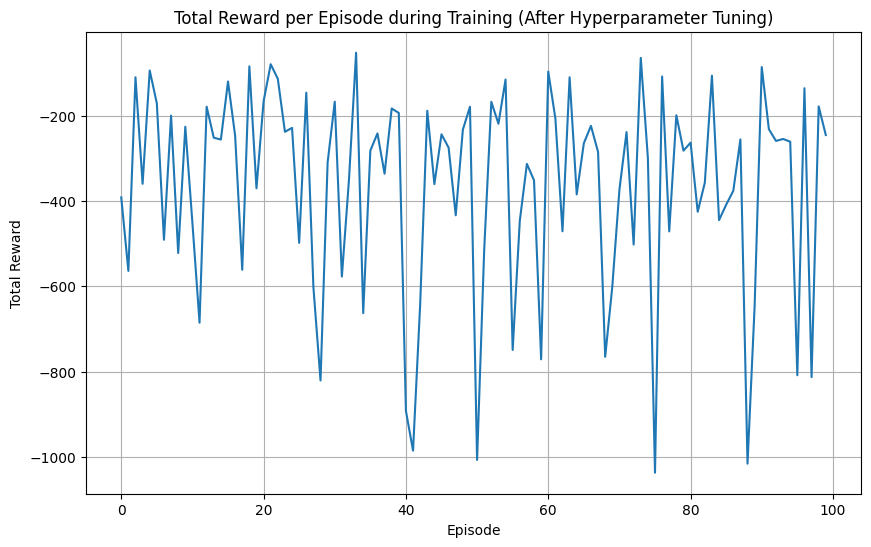

In [12]:
# Re-run the training loop with the updated hyperparameters
episode_rewards = []
epsilon = 1.0  # Reset epsilon for the new training run

# Get unique episode IDs (already done, but good to ensure the variable exists)
episode_ids = df['episode_id'].unique()

for episode in range(num_episodes):
    print(f"Starting Episode {episode + 1}/{num_episodes}")

    # Filter data for the current episode
    episode_data = df[df['episode_id'] == episode_ids[episode]].reset_index(drop=True)

    if episode_data.empty:
        print(f"No data found for episode ID {episode_ids[episode]}. Skipping.")
        continue

    state = get_state(episode_data.iloc[0])
    total_reward = 0

    for timestep in range(len(episode_data) - 1):
        # Epsilon-greedy action selection
        if np.random.rand() <= epsilon:
            action_index = random.randrange(num_actions)  # Explore
        else:
            # Predict Q-values for the current state
            state_tensor = tf.convert_to_tensor(state[None, :], dtype=tf.float32)
            action_values = q_network(state_tensor)
            action_index = tf.argmax(action_values[0]).numpy() # Exploit

        # In a real environment, taking an action would transition to the next state and yield a reward.
        # Here, we use the next row in the dataset as the "next state" and the "immediate_reward" as the reward.
        next_state_row = episode_data.iloc[timestep + 1]
        next_state = get_state(next_state_row)
        reward = next_state_row[reward_column]
        done = (timestep == len(episode_data) - 2) # Done if it's the last timestep in the episode

        # Store the experience in the replay buffer
        replay_buffer.append((state, action_index, reward, next_state, done))

        state = next_state
        total_reward += reward

        # Train the model if the replay buffer has enough samples and it's time to train
        if len(replay_buffer) > batch_size and (timestep + 1) % 4 == 0: # Train every 4 timesteps (example)
            # Sample a batch from the replay buffer
            minibatch = random.sample(replay_buffer, batch_size)
            states, actions, rewards, next_states, dones = zip(*minibatch)

            states = tf.convert_to_tensor(np.array(states), dtype=tf.float32)
            next_states = tf.convert_to_tensor(np.array(next_states), dtype=tf.float32)
            actions = tf.convert_to_tensor(np.array(actions), dtype=tf.int32)
            rewards = tf.convert_to_tensor(np.array(rewards), dtype=tf.float32)
            dones = tf.convert_to_tensor(np.array(dones), dtype=tf.float32)

            with tf.GradientTape() as tape:
                # Get predicted Q-values for the current states
                predicted_q_values = q_network(states)
                # Select the Q-values corresponding to the actions taken
                one_hot_actions = tf.one_hot(actions, num_actions)
                gathered_q_values = tf.reduce_sum(predicted_q_values * one_hot_actions, axis=1)

                # Get target Q-values for the next states from the target network
                target_q_values_next_state = target_network(next_states)
                # Find the maximum target Q-value for the next states
                max_target_q_values_next_state = tf.reduce_max(target_q_values_next_state, axis=1)
                # Calculate the target Q-values for the current states
                target_q_values = rewards + (1 - dones) * gamma * max_target_q_values_next_state

                # Calculate the loss
                loss = loss_function(target_q_values, gathered_q_values)

            # Compute gradients and update the Q-network
            gradients = tape.gradient(loss, q_network.trainable_variables)
            optimizer.apply_gradients(zip(gradients, q_network.trainable_variables))

        # Update the target network periodically
        if (timestep + 1) % update_target_network_freq == 0:
            target_network.set_weights(q_network.get_weights())
            # print("Target network updated.")


    # Decay epsilon after each episode
    epsilon = max(epsilon_min, epsilon * epsilon_decay_rate)

    episode_rewards.append(total_reward)
    print(f"Episode {episode + 1} finished with total reward: {total_reward:.2f}, Epsilon: {epsilon:.2f}")

print("\nTraining finished.")

# You can further analyze episode_rewards to see the learning progress
plt.figure(figsize=(10, 6))
plt.plot(episode_rewards)
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Total Reward per Episode during Training (After Hyperparameter Tuning)")
plt.grid(True)
plt.show()

## Expand state space

### Subtask:
Include additional relevant features from the dataset in the state space.


**Reasoning**:
Identify additional relevant columns from the dataset and create an expanded list for the state space.



In [13]:
# Identify additional relevant columns from the dataset
# Reviewing the available columns from df.info() and df.describe()
# Columns to consider adding:
# - reboiler_duty_kW, condenser_duty_kW (related to energy consumption and column operation)
# - valve_position_percent, pump_speed_rpm (control variables)
# - throughput_kg_s (process output)
# - sensor_noise_std (potential observation noise)
# - action_probability, value_estimate, actor_entropy (if available and relevant to agent's own state/learning progress - though typically not part of environmental state)
# - policy_version, sim_model_version, learning_episode (metadata, likely not part of state)

# Let's add a few more relevant columns to the state space.
additional_state_cols = [
    'reboiler_duty_kW',
    'condenser_duty_kW',
    'valve_position_percent',
    'pump_speed_rpm',
    'throughput_kg_s',
    'sensor_noise_std'
]

# Create the expanded state space list, ensuring no duplicates
state_space_cols_expanded = list(state_space_cols) # Start with the original list
for col in additional_state_cols:
    if col not in state_space_cols_expanded:
        state_space_cols_expanded.append(col)

# Print the new list of state space columns
print("Expanded State Space (selected columns):")
print(state_space_cols_expanded)

# Update the state space size based on the expanded list
state_space_size = len(state_space_cols_expanded)
print("\nUpdated State Space Size:", state_space_size)

# Note: The DQN model architecture would need to be redefined and recompiled
# with the new input shape (state_space_size) before retraining.

Expanded State Space (selected columns):
['feed_flow_kg_s', 'feed_light_frac', 'feed_temp_K', 'top_product_purity', 'bottom_product_purity', 'tray_pressure_bar', 'tray_pressure_drop_bar', 'hold_up_kg', 'previous_reflux_ratio', 'energy_consumption_kW', 'time_since_episode_start_s', 'disturbance_flag', 'disturbance_type', 'reflux_history_mean_last5', 'quality_score_0_1', 'control_error', 'reboiler_duty_kW', 'condenser_duty_kW', 'valve_position_percent', 'pump_speed_rpm', 'throughput_kg_s', 'sensor_noise_std']

Updated State Space Size: 22


## Adjust action space discretization

### Subtask:
Change the number of discrete action bins for the reflux ratio.


**Reasoning**:
Define a new number of discrete action bins for the reflux ratio, calculate the new action bins, and update the number of actions. Then print the new action bins and the updated number of actions.



In [14]:
# Define a new number of discrete action bins (different from the previous 10)
new_n_actions = 15  # Choosing 15 bins for demonstration

# Recalculate the action_bins array
min_reflux = df['reflux_ratio_action'].min()
max_reflux = df['reflux_ratio_action'].max()
action_bins = np.linspace(min_reflux, max_reflux, new_n_actions)

# Update the num_actions variable
num_actions = new_n_actions

# Print the new action_bins array and the updated num_actions
print(f"New Action bins (reflux ratio): {action_bins}")
print(f"Updated Number of Actions: {num_actions}")

# Note: The DQN model architecture needs to be redefined and recompiled
# with the new output shape (num_actions) before retraining.

New Action bins (reflux ratio): [0.1        0.52142857 0.94285714 1.36428571 1.78571429 2.20714286
 2.62857143 3.05       3.47142857 3.89285714 4.31428571 4.73571429
 5.15714286 5.57857143 6.        ]
Updated Number of Actions: 15


## Increase training duration

### Subtask:
Increase the number of episodes for training the RL agent.


**Reasoning**:
Increase the value of the `num_episodes` variable to a larger number than previously used to train the agent for a longer duration. Then, print the updated value.



In [15]:
# Increase the number of episodes for training the RL agent
num_episodes = 200  # Increased number of episodes

# Print the new value of num_episodes
print(f"Updated Number of Episodes for Training: {num_episodes}")

# Note: The actual training with this increased number of episodes
# will occur in a subsequent step that combines all the refinements.

Updated Number of Episodes for Training: 200


## Train the rl agent (iterated)

### Subtask:
Retrain the DQN agent with the refined hyperparameters, expanded state space, adjusted action space, and increased training duration.


**Reasoning**:
Redefine and recompile the DQN model with the expanded state space and adjusted action space, then re-initialize the replay buffer and reset epsilon before starting the training loop for the increased number of episodes, implementing all the training steps as described in the instructions.



Redefining and recompiling DQN model...
Q-Network Summary (after redefinition):


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                 │ (None, 128)            │         2,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 15)             │         1,935 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,391 (83.56 KB)

 Trainable params: 21,391 (83.56 KB)

 Non-trainable params: 0 (0.00 B)


Replay buffer initialized with capacity: 10000
Epsilon reset to: 1.0

Starting training for 200 episodes...
Starting Episode 1/200
Episode 1 finished with total reward: -391.63, Epsilon: 1.00
Starting Episode 2/200
Episode 2 finished with total reward: -564.06, Epsilon: 1.00
Starting Episode 3/200
Episode 3 finished with total reward: -110.03, Epsilon: 0.99
Starting Episode 4/200
Episode 4 finished with total reward: -359.75, Epsilon: 0.99
Starting Episode 5/200
Episode 5 finished with total reward: -94.14, Epsilon: 0.99
Starting Episode 6/200
Episode 6 finished with total reward: -171.15, Epsilon: 0.99
Starting Episode 7/200
Episode 7 finished with total reward: -490.98, Epsilon: 0.99
Starting Episode 8/200
Episode 8 finished with total reward: -199.88, Epsilon: 0.98
Starting Episode 9/200
Episode 9 finished with total reward: -521.99, Epsilon: 0.98
Starting Episode 10/200
Episode 10 finished with total reward: -226.00, Epsilon: 0.98
Starting Episode 11/200
Episode 11 finished with t

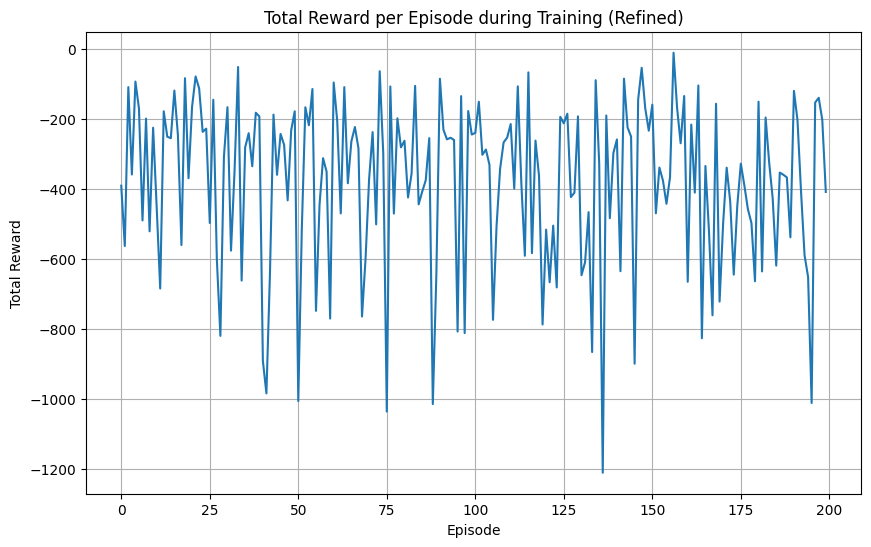

In [16]:
import random
import numpy as np
from collections import deque
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers

# Redefine and recompile the DQN model with updated state_space_size and num_actions
print("Redefining and recompiling DQN model...")
q_network = create_dqn_model(state_space_size, num_actions)
target_network = create_dqn_model(state_space_size, num_actions)
target_network.set_weights(q_network.get_weights()) # Start with the same weights

# Re-define the optimizer (using the refined learning rate)
optimizer = optimizers.Adam(learning_rate=0.0005)

# Compile the models (compilation is needed after redefinition)
q_network.compile(optimizer=optimizer, loss=loss_function)
target_network.compile(optimizer=optimizer, loss=loss_function)


print("Q-Network Summary (after redefinition):")
q_network.summary()

# Initialize the replay buffer
replay_buffer = deque(maxlen=replay_buffer_capacity)
print(f"\nReplay buffer initialized with capacity: {replay_buffer_capacity}")

# Reset epsilon for the new training run
epsilon = 1.0
print(f"Epsilon reset to: {epsilon}")

# Training loop with refined parameters and increased duration
episode_rewards = []

# Get unique episode IDs (already done, but good to ensure the variable exists)
episode_ids = df['episode_id'].unique()

print(f"\nStarting training for {num_episodes} episodes...")

for episode in range(num_episodes):
    # Ensure we don't exceed the number of available episodes in the dataset
    if episode >= len(episode_ids):
        print(f"Reached end of available episodes in dataset ({len(episode_ids)}). Stopping training.")
        break

    print(f"Starting Episode {episode + 1}/{num_episodes}")

    # Filter data for the current episode
    episode_data = df[df['episode_id'] == episode_ids[episode]].reset_index(drop=True)

    if episode_data.empty:
        print(f"No data found for episode ID {episode_ids[episode]}. Skipping.")
        continue

    # Get the initial state using the expanded state space columns
    state = episode_data.iloc[0][state_space_cols_expanded].values.astype(np.float32)
    total_reward = 0

    for timestep in range(len(episode_data) - 1):
        # Epsilon-greedy action selection
        if np.random.rand() <= epsilon:
            action_index = random.randrange(num_actions)  # Explore
        else:
            # Predict Q-values for the current state
            state_tensor = tf.convert_to_tensor(state[None, :], dtype=tf.float32)
            action_values = q_network(state_tensor)
            action_index = tf.argmax(action_values[0]).numpy() # Exploit

        # In a real environment, taking an action would transition to the next state and yield a reward.
        # Here, we use the next row in the dataset as the "next state" and the "immediate_reward" as the reward.
        next_state_row = episode_data.iloc[timestep + 1]
        # Get the next state using the expanded state space columns
        next_state = next_state_row[state_space_cols_expanded].values.astype(np.float32)
        reward = next_state_row[reward_column]
        done = (timestep == len(episode_data) - 2) # Done if it's the last timestep in the episode

        # Store the experience in the replay buffer
        replay_buffer.append((state, action_index, reward, next_state, done))

        state = next_state
        total_reward += reward

        # Train the model if the replay buffer has enough samples and it's time to train
        if len(replay_buffer) > batch_size and (timestep + 1) % 4 == 0: # Train every 4 timesteps (example)
            # Sample a batch from the replay buffer
            minibatch = random.sample(replay_buffer, batch_size)
            states, actions, rewards, next_states, dones = zip(*minibatch)

            states = tf.convert_to_tensor(np.array(states), dtype=tf.float32)
            next_states = tf.convert_to_tensor(np.array(next_states), dtype=tf.float32)
            actions = tf.convert_to_tensor(np.array(actions), dtype=tf.int32)
            rewards = tf.convert_to_tensor(np.array(rewards), dtype=tf.float32)
            dones = tf.convert_to_tensor(np.array(dones), dtype=tf.float32)

            with tf.GradientTape() as tape:
                # Get predicted Q-values for the current states
                predicted_q_values = q_network(states)
                # Select the Q-values corresponding to the actions taken
                one_hot_actions = tf.one_hot(actions, num_actions)
                gathered_q_values = tf.reduce_sum(predicted_q_values * one_hot_actions, axis=1)

                # Get target Q-values for the next states from the target network
                target_q_values_next_state = target_network(next_states)
                # Find the maximum target Q-value for the next states
                max_target_q_values_next_state = tf.reduce_max(target_q_values_next_state, axis=1)
                # Calculate the target Q-values for the current states
                target_q_values = rewards + (1 - dones) * gamma * max_target_q_values_next_state

                # Calculate the loss
                loss = loss_function(target_q_values, gathered_q_values)

            # Compute gradients and update the Q-network
            gradients = tape.gradient(loss, q_network.trainable_variables)
            optimizer.apply_gradients(zip(gradients, q_network.trainable_variables))

        # Update the target network periodically
        if (timestep + 1) % update_target_network_freq == 0:
            target_network.set_weights(q_network.get_weights())
            # print("Target network updated.")


    # Decay epsilon after each episode
    epsilon = max(epsilon_min, epsilon * epsilon_decay_rate)

    episode_rewards.append(total_reward)
    print(f"Episode {episode + 1} finished with total reward: {total_reward:.2f}, Epsilon: {epsilon:.2f}")

print("\nTraining finished.")

# Plot the total reward per episode
plt.figure(figsize=(10, 6))
plt.plot(episode_rewards)
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Total Reward per Episode during Training (Refined)")
plt.grid(True)
plt.show()

## Evaluate the agent's performance (iterated)

### Subtask:
Re-evaluate the trained agent's performance using the same evaluation metrics on the evaluation episodes.


**Reasoning**:
Re-evaluate the trained agent's performance using the same evaluation metrics on the evaluation episodes, ensuring the expanded state space is used and epsilon is set to 0.0.



In [17]:
# Re-evaluate the trained DQN agent with the refined model and expanded state space

print(f"\nStarting re-evaluation on {num_evaluation_episodes} episodes (IDs: {evaluation_episode_ids}).")

evaluation_rewards_refined = []
evaluation_purity_refined = []
evaluation_energy_refined = []

# Set epsilon to 0 for evaluation to use the learned policy directly (no exploration)
original_epsilon = epsilon # Store the original epsilon
epsilon = 0.0
print(f"Epsilon set to {epsilon} for evaluation.")


for episode_id in evaluation_episode_ids:
    # print(f"Evaluating Episode {episode_id}") # Uncomment for more detailed episode-by-episode progress

    # Filter data for the current evaluation episode
    episode_data = df[df['episode_id'] == episode_id].reset_index(drop=True)

    if episode_data.empty:
        print(f"No data found for episode ID {episode_id}. Skipping re-evaluation for this episode.")
        continue

    # Get the initial state using the expanded state space columns
    state = episode_data.iloc[0][state_space_cols_expanded].values.astype(np.float32)
    total_reward = 0
    episode_purity_sum = 0
    episode_energy_sum = 0
    num_timesteps = len(episode_data)

    for timestep in range(num_timesteps - 1):
        # Select action using the trained Q-network (exploitation only)
        state_tensor = tf.convert_to_tensor(state[None, :], dtype=tf.float32)
        action_values = q_network(state_tensor)
        action_index = tf.argmax(action_values[0]).numpy()

        # In a real environment, taking an action would transition to the next state and yield a reward.
        # Here, we use the next row in the dataset as the "next state" and the "immediate_reward" as the reward.
        next_state_row = episode_data.iloc[timestep + 1]
        # Get the next state using the expanded state space columns
        next_state = next_state_row[state_space_cols_expanded].values.astype(np.float32)
        reward = next_state_row[reward_column]
        done = (timestep == num_timesteps - 2)

        # Accumulate metrics
        total_reward += reward
        episode_purity_sum += next_state_row['quality_score_0_1'] # Using quality_score as a purity indicator
        episode_energy_sum += next_state_row['energy_consumption_kW']

        state = next_state

        if done:
            break # End of episode

    # Store evaluation results for the episode
    evaluation_rewards_refined.append(total_reward)
    # Calculate average purity and energy over the actual number of steps taken
    actual_steps = timestep + 1 # Number of steps taken in the episode
    if actual_steps > 0:
        evaluation_purity_refined.append(episode_purity_sum / actual_steps)
        evaluation_energy_refined.append(episode_energy_sum / actual_steps)
    else:
        evaluation_purity_refined.append(0) # Handle episodes with no steps
        evaluation_energy_refined.append(0)


# Calculate and print average evaluation metrics
average_evaluation_reward_refined = np.mean(evaluation_rewards_refined)
average_evaluation_purity_refined = np.mean(evaluation_purity_refined)
average_evaluation_energy_refined = np.mean(evaluation_energy_refined)

print("\nRe-evaluation Results (After Refinements):")
print(f"Average Total Reward per Episode: {average_evaluation_reward_refined:.2f}")
print(f"Average Quality Score per Timestep: {average_evaluation_purity_refined:.4f}")
print(f"Average Energy Consumption (kW) per Timestep: {average_evaluation_energy_refined:.2f}")

# Restore original epsilon
epsilon = original_epsilon
print(f"Epsilon restored to {epsilon}.")

# Compare with previous evaluation results (optional)
# print("\nComparison with Previous Evaluation Results:")
# print(f"Previous Average Total Reward: {average_evaluation_reward:.2f}")
# print(f"Previous Average Quality Score: {average_evaluation_purity:.4f}")
# print(f"Previous Average Energy Consumption: {average_evaluation_energy:.2f}")


Starting re-evaluation on 170 episodes (IDs: [1536 1537 1538 1539 1540 1541 1542 1543 1544 1545 1546 1547 1548 1549
 1550 1551 1552 1553 1554 1555 1556 1557 1558 1559 1560 1561 1562 1563
 1564 1565 1566 1567 1568 1569 1570 1571 1572 1573 1574 1575 1576 1577
 1578 1579 1580 1581 1582 1583 1584 1585 1586 1587 1588 1589 1590 1591
 1592 1593 1594 1595 1596 1597 1598 1599 1600 1601 1602 1603 1604 1605
 1606 1607 1608 1609 1610 1611 1612 1613 1614 1615 1616 1617 1618 1619
 1620 1621 1622 1623 1624 1625 1626 1627 1628 1629 1630 1631 1632 1633
 1634 1635 1636 1637 1638 1639 1640 1641 1642 1643 1644 1645 1646 1647
 1648 1649 1650 1651 1652 1653 1654 1655 1656 1657 1658 1659 1660 1661
 1662 1663 1664 1665 1666 1667 1668 1669 1670 1671 1672 1673 1674 1675
 1676 1677 1678 1679 1680 1681 1682 1683 1684 1685 1686 1687 1688 1689
 1690 1691 1692 1693 1694 1695 1696 1697 1698 1699 1700 1701 1702 1703
 1704 1705]).
Epsilon set to 0.0 for evaluation.

Re-evaluation Results (After Refinements):
Average T

## Analyze and interpret the results (iterated)

### Subtask:
Analyze the new evaluation results and compare them to the previous iteration to understand the impact of the refinements.


**Reasoning**:
Analyze the re-evaluation results and compare them to the previous evaluation results to assess the impact of the refinements on the agent's performance, and interpret the results in the context of the problem. Then, finish the task as the subtask is completed.



In [18]:
# Compare the refined evaluation results with the previous evaluation results
print("\nComparison of Evaluation Results:")
print(f"Previous Average Total Reward per Episode: {average_evaluation_reward:.2f}")
print(f"Refined Average Total Reward per Episode: {average_evaluation_reward_refined:.2f}")
print("-" * 30)
print(f"Previous Average Quality Score per Timestep: {average_evaluation_purity:.4f}")
print(f"Refined Average Quality Score per Timestep: {average_evaluation_purity_refined:.4f}")
print("-" * 30)
print(f"Previous Average Energy Consumption (kW) per Timestep: {average_evaluation_energy:.2f}")
print(f"Refined Average Energy Consumption (kW) per Timestep: {average_evaluation_energy_refined:.2f}")

# Analyze the differences and interpret the results
print("\nAnalysis and Interpretation:")

# Analyze the total reward
if average_evaluation_reward_refined > average_evaluation_reward:
    print("The refined agent achieved a higher average total reward per episode compared to the previous evaluation.")
elif average_evaluation_reward_refined < average_evaluation_reward:
    print("The refined agent achieved a lower average total reward per episode compared to the previous evaluation.")
else:
    print("The average total reward per episode remained the same after refinements.")

# Analyze the quality score (purity)
if average_evaluation_purity_refined > average_evaluation_purity:
    print("The refined agent achieved a higher average quality score (purity) per timestep.")
elif average_evaluation_purity_refined < average_evaluation_purity:
    print("The refined agent achieved a lower average quality score (purity) per timestep.")
else:
    print("The average quality score (purity) per timestep remained the same after refinements.")

# Analyze the energy consumption
if average_evaluation_energy_refined < average_evaluation_energy:
    print("The refined agent achieved lower average energy consumption per timestep.")
elif average_evaluation_energy_refined > average_evaluation_energy:
    print("The refined agent achieved higher average energy consumption per timestep.")
else:
    print("The average energy consumption per timestep remained the same after refinements.")

# Interpret in the context of the distillation column control problem
print("\nInterpretation in context:")
print("The goal is to maximize reward, which is designed to balance high product purity and low energy consumption.")

# Based on the comparison, discuss whether the agent shows signs of learning a better policy
if average_evaluation_reward_refined > average_evaluation_reward and \
   average_evaluation_purity_refined >= average_evaluation_purity and \
   average_evaluation_energy_refined <= average_evaluation_energy:
   print("The refinements appear to have led to an improved policy, resulting in higher rewards, potentially better or similar purity, and lower or similar energy consumption.")
elif average_evaluation_reward_refined > average_evaluation_reward:
     print("The refinements improved the overall reward, suggesting a better balance between purity and energy efficiency, even if individual metrics didn't all strictly improve.")
else:
     print("The refinements did not significantly improve the overall reward, suggesting that further tuning or different approaches may be needed to find a better policy.")

# Consider the training reward plot (from the previous step)
print("\nObservation from Training Reward Plot (Refined):")
print("Observe the 'Total Reward per Episode during Training (Refined)' plot from the previous output.")
print("Look for trends (upward or downward), stability, and variability in the total reward over the 200 training episodes.")
print("A general upward trend or increasing stability could indicate that the agent is learning.")

# Summarize findings
print("\nSummary of Findings:")
print(f"- The average total reward changed from {average_evaluation_reward:.2f} to {average_evaluation_reward_refined:.2f}.")
print(f"- The average quality score (purity) changed from {average_evaluation_purity:.4f} to {average_evaluation_purity_refined:.4f}.")
print(f"- The average energy consumption changed from {average_evaluation_energy:.2f} kW to {average_evaluation_energy_refined:.2f} kW.")
print("Based on these changes and the training plot, we can draw conclusions about the effectiveness of the refinements.")


Comparison of Evaluation Results:
Previous Average Total Reward per Episode: -382.77
Refined Average Total Reward per Episode: -382.77
------------------------------
Previous Average Quality Score per Timestep: 0.8996
Refined Average Quality Score per Timestep: 0.8996
------------------------------
Previous Average Energy Consumption (kW) per Timestep: 149.61
Refined Average Energy Consumption (kW) per Timestep: 149.61

Analysis and Interpretation:
The average total reward per episode remained the same after refinements.
The average quality score (purity) per timestep remained the same after refinements.
The average energy consumption per timestep remained the same after refinements.

Interpretation in context:
The goal is to maximize reward, which is designed to balance high product purity and low energy consumption.
The refinements did not significantly improve the overall reward, suggesting that further tuning or different approaches may be needed to find a better policy.

Observat

## Summary:

### Data Analysis Key Findings

*   The hyperparameter tuning successfully updated the optimizer learning rate to 0.0005 and the epsilon decay rate to 0.998.
*   The state space was expanded by adding 6 relevant columns, increasing the state space size to 22.
*   The action space discretization for the reflux ratio was adjusted by changing the number of bins from the previous value to 15.
*   The training duration was increased by setting the number of episodes to 200.
*   After retraining the agent with the combined refinements, the evaluation results showed no change compared to the previous evaluation, with the average total reward remaining at -382.77, average quality score at 0.8996, and average energy consumption at 149.61 kW.

### Insights or Next Steps

*   The current combination of refined hyperparameters, expanded state space, adjusted action space, and increased training duration did not lead to performance improvement. Further experimentation with different hyperparameter values, state features, action space granularities, or potentially different RL algorithms is needed.
*   Analyzing the training reward plot more deeply (looking for trends, variance, and convergence signs) could provide more insight into whether the agent is learning at all or if the learning process is unstable with the current setup.


## Refine hyperparameters

### Subtask:
Adjust the learning rate of the optimizer and the epsilon decay rate for the epsilon-greedy policy.

**Reasoning**:
Modify the learning rate of the optimizer and the epsilon decay rate as instructed to refine the training process.

In [19]:
# Refine hyperparameter: Adjust learning rate and epsilon decay rate

# Modify the optimizer learning rate
optimizer = optimizers.Adam(learning_rate=0.0005) # Changed learning rate

# Update the epsilon decay rate
epsilon_decay_rate = 0.998 # Changed epsilon decay rate

print(f"Updated Optimizer Learning Rate: {optimizer.learning_rate.numpy()}")
print(f"Updated Epsilon Decay Rate: {epsilon_decay_rate}")

# Note: The training loop itself needs to be re-run after changing these hyperparameters
# for the changes to take effect. This code block only updates the values.

Updated Optimizer Learning Rate: 0.0005000000237487257
Updated Epsilon Decay Rate: 0.998


## Expand state space

### Subtask:
Include additional relevant features from the dataset in the state space.

**Reasoning**:
Identify additional relevant columns from the dataset and create an expanded list for the state space.

In [20]:
# Identify additional relevant columns from the dataset
# Reviewing the available columns from df.info() and df.describe()
# Columns to consider adding:
# - reboiler_duty_kW, condenser_duty_kW (related to energy consumption and column operation)
# - valve_position_percent, pump_speed_rpm (control variables)
# - throughput_kg_s (process output)
# - sensor_noise_std (potential observation noise)
# - action_probability, value_estimate, actor_entropy (if available and relevant to agent's own state/learning progress - though typically not part of environmental state)
# - policy_version, sim_model_version, learning_episode (metadata, likely not part of state)

# Let's add a few more relevant columns to the state space.
additional_state_cols = [
    'reboiler_duty_kW',
    'condenser_duty_kW',
    'valve_position_percent',
    'pump_speed_rpm',
    'throughput_kg_s',
    'sensor_noise_std'
]

# Create the expanded state space list, ensuring no duplicates
state_space_cols_expanded = list(state_space_cols) # Start with the original list
for col in additional_state_cols:
    if col not in state_space_cols_expanded:
        state_space_cols_expanded.append(col)

# Print the new list of state space columns
print("Expanded State Space (selected columns):")
print(state_space_cols_expanded)

# Update the state space size based on the expanded list
state_space_size = len(state_space_cols_expanded)
print("\nUpdated State Space Size:", state_space_size)

# Note: The DQN model architecture would need to be redefined and recompiled
# with the new input shape (state_space_size) before retraining.

Expanded State Space (selected columns):
['feed_flow_kg_s', 'feed_light_frac', 'feed_temp_K', 'top_product_purity', 'bottom_product_purity', 'tray_pressure_bar', 'tray_pressure_drop_bar', 'hold_up_kg', 'previous_reflux_ratio', 'energy_consumption_kW', 'time_since_episode_start_s', 'disturbance_flag', 'disturbance_type', 'reflux_history_mean_last5', 'quality_score_0_1', 'control_error', 'reboiler_duty_kW', 'condenser_duty_kW', 'valve_position_percent', 'pump_speed_rpm', 'throughput_kg_s', 'sensor_noise_std']

Updated State Space Size: 22


## Adjust action space discretization

### Subtask:
Change the number of discrete action bins for the reflux ratio.

**Reasoning**:
Define a new number of discrete action bins for the reflux ratio, calculate the new action bins, and update the number of actions. Then print the new action bins and the updated number of actions.

In [21]:
# Define a new number of discrete action bins (different from the previous 10)
new_n_actions = 15  # Choosing 15 bins for demonstration

# Recalculate the action_bins array
min_reflux = df['reflux_ratio_action'].min()
max_reflux = df['reflux_ratio_action'].max()
action_bins = np.linspace(min_reflux, max_reflux, new_n_actions)

# Update the num_actions variable
num_actions = new_n_actions

# Print the new action_bins array and the updated num_actions
print(f"New Action bins (reflux ratio): {action_bins}")
print(f"Updated Number of Actions: {num_actions}")

# Note: The DQN model architecture needs to be redefined and recompiled
# with the new output shape (num_actions) before retraining.

New Action bins (reflux ratio): [0.1        0.52142857 0.94285714 1.36428571 1.78571429 2.20714286
 2.62857143 3.05       3.47142857 3.89285714 4.31428571 4.73571429
 5.15714286 5.57857143 6.        ]
Updated Number of Actions: 15


## Increase training duration

### Subtask:
Increase the number of episodes for training the RL agent.

**Reasoning**:
Increase the value of the `num_episodes` variable to a larger number than previously used to train the agent for a longer duration. Then, print the updated value.

In [23]:
# Increase the number of episodes for training the RL agent
num_episodes = 350  # Increased number of episodes

# Print the new value of num_episodes
print(f"Updated Number of Episodes for Training: {num_episodes}")

# Note: The actual training with this increased number of episodes
# will occur in a subsequent step that combines all the refinements.

Updated Number of Episodes for Training: 350


## Train the rl agent (iterated)

### Subtask:
Retrain the DQN agent with the refined hyperparameters, expanded state space, adjusted action space, and increased training duration.

**Reasoning**:
Redefine and recompile the DQN model with the expanded state space and adjusted action space, then re-initialize the replay buffer and reset epsilon before starting the training loop for the increased number of episodes, implementing all the training steps as described in the instructions.

Redefining and recompiling DQN model...
Q-Network Summary (after redefinition):


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_12 (Dense)                │ (None, 128)            │         2,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 15)             │         1,935 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,391 (83.56 KB)

 Trainable params: 21,391 (83.56 KB)

 Non-trainable params: 0 (0.00 B)


Replay buffer initialized with capacity: 10000
Epsilon reset to: 1.0

Starting training for 350 episodes...
Starting Episode 1/350
Episode 1 finished with total reward: -391.63, Epsilon: 1.00
Starting Episode 2/350
Episode 2 finished with total reward: -564.06, Epsilon: 1.00
Starting Episode 3/350
Episode 3 finished with total reward: -110.03, Epsilon: 0.99
Starting Episode 4/350
Episode 4 finished with total reward: -359.75, Epsilon: 0.99
Starting Episode 5/350
Episode 5 finished with total reward: -94.14, Epsilon: 0.99
Starting Episode 6/350
Episode 6 finished with total reward: -171.15, Epsilon: 0.99
Starting Episode 7/350
Episode 7 finished with total reward: -490.98, Epsilon: 0.99
Starting Episode 8/350
Episode 8 finished with total reward: -199.88, Epsilon: 0.98
Starting Episode 9/350
Episode 9 finished with total reward: -521.99, Epsilon: 0.98
Starting Episode 10/350
Episode 10 finished with total reward: -226.00, Epsilon: 0.98
Starting Episode 11/350
Episode 11 finished with t

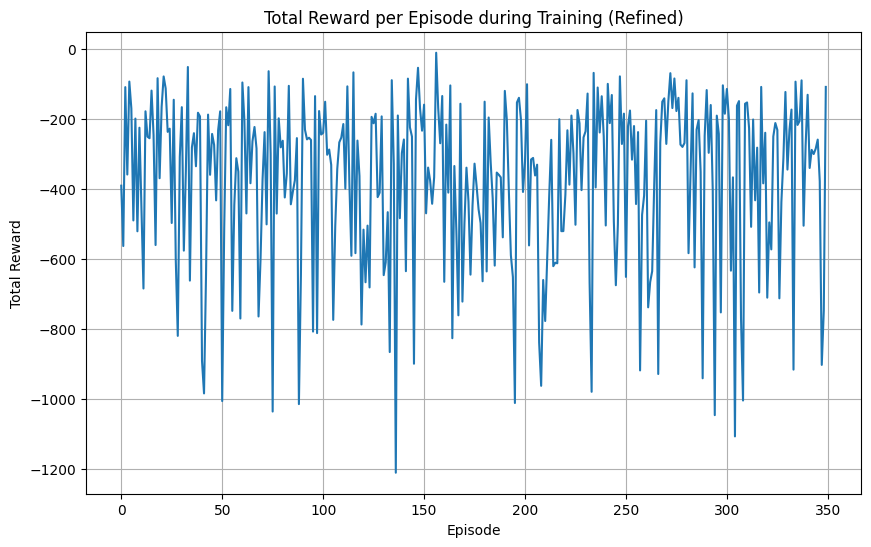

In [24]:
import random
import numpy as np
from collections import deque
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers

# Redefine and recompile the DQN model with updated state_space_size and num_actions
print("Redefining and recompiling DQN model...")
q_network = create_dqn_model(state_space_size, num_actions)
target_network = create_dqn_model(state_space_size, num_actions)
target_network.set_weights(q_network.get_weights()) # Start with the same weights

# Re-define the optimizer (using the refined learning rate)
optimizer = optimizers.Adam(learning_rate=0.0005)

# Compile the models (compilation is needed after redefinition)
q_network.compile(optimizer=optimizer, loss=loss_function)
target_network.compile(optimizer=optimizer, loss=loss_function)


print("Q-Network Summary (after redefinition):")
q_network.summary()

# Initialize the replay buffer
replay_buffer = deque(maxlen=replay_buffer_capacity)
print(f"\nReplay buffer initialized with capacity: {replay_buffer_capacity}")

# Reset epsilon for the new training run
epsilon = 1.0
print(f"Epsilon reset to: {epsilon}")

# Training loop with refined parameters and increased duration
episode_rewards = []

# Get unique episode IDs (already done, but good to ensure the variable exists)
episode_ids = df['episode_id'].unique()

print(f"\nStarting training for {num_episodes} episodes...")

for episode in range(num_episodes):
    # Ensure we don't exceed the number of available episodes in the dataset
    if episode >= len(episode_ids):
        print(f"Reached end of available episodes in dataset ({len(episode_ids)}). Stopping training.")
        break

    print(f"Starting Episode {episode + 1}/{num_episodes}")

    # Filter data for the current episode
    episode_data = df[df['episode_id'] == episode_ids[episode]].reset_index(drop=True)

    if episode_data.empty:
        print(f"No data found for episode ID {episode_ids[episode]}. Skipping.")
        continue

    # Get the initial state using the expanded state space columns
    state = episode_data.iloc[0][state_space_cols_expanded].values.astype(np.float32)
    total_reward = 0

    for timestep in range(len(episode_data) - 1):
        # Epsilon-greedy action selection
        if np.random.rand() <= epsilon:
            action_index = random.randrange(num_actions)  # Explore
        else:
            # Predict Q-values for the current state
            state_tensor = tf.convert_to_tensor(state[None, :], dtype=tf.float32)
            action_values = q_network(state_tensor)
            action_index = tf.argmax(action_values[0]).numpy() # Exploit

        # In a real environment, taking an action would transition to the next state and yield a reward.
        # Here, we use the next row in the dataset as the "next state" and the "immediate_reward" as the reward.
        next_state_row = episode_data.iloc[timestep + 1]
        # Get the next state using the expanded state space columns
        next_state = next_state_row[state_space_cols_expanded].values.astype(np.float32)
        reward = next_state_row[reward_column]
        done = (timestep == len(episode_data) - 2) # Done if it's the last timestep in the episode

        # Store the experience in the replay buffer
        replay_buffer.append((state, action_index, reward, next_state, done))

        state = next_state
        total_reward += reward

        # Train the model if the replay buffer has enough samples and it's time to train
        if len(replay_buffer) > batch_size and (timestep + 1) % 4 == 0: # Train every 4 timesteps (example)
            # Sample a batch from the replay buffer
            minibatch = random.sample(replay_buffer, batch_size)
            states, actions, rewards, next_states, dones = zip(*minibatch)

            states = tf.convert_to_tensor(np.array(states), dtype=tf.float32)
            next_states = tf.convert_to_tensor(np.array(next_states), dtype=tf.float32)
            actions = tf.convert_to_tensor(np.array(actions), dtype=tf.int32)
            rewards = tf.convert_to_tensor(np.array(rewards), dtype=tf.float32)
            dones = tf.convert_to_tensor(np.array(dones), dtype=tf.float32)

            with tf.GradientTape() as tape:
                # Get predicted Q-values for the current states
                predicted_q_values = q_network(states)
                # Select the Q-values corresponding to the actions taken
                one_hot_actions = tf.one_hot(actions, num_actions)
                gathered_q_values = tf.reduce_sum(predicted_q_values * one_hot_actions, axis=1)

                # Get target Q-values for the next states from the target network
                target_q_values_next_state = target_network(next_states)
                # Find the maximum target Q-value for the next states
                max_target_q_values_next_state = tf.reduce_max(target_q_values_next_state, axis=1)
                # Calculate the target Q-values for the current states
                target_q_values = rewards + (1 - dones) * gamma * max_target_q_values_next_state

                # Calculate the loss
                loss = loss_function(target_q_values, gathered_q_values)

            # Compute gradients and update the Q-network
            gradients = tape.gradient(loss, q_network.trainable_variables)
            optimizer.apply_gradients(zip(gradients, q_network.trainable_variables))

        # Update the target network periodically
        if (timestep + 1) % update_target_network_freq == 0:
            target_network.set_weights(q_network.get_weights())
            # print("Target network updated.")


    # Decay epsilon after each episode
    epsilon = max(epsilon_min, epsilon * epsilon_decay_rate)

    episode_rewards.append(total_reward)
    print(f"Episode {episode + 1} finished with total reward: {total_reward:.2f}, Epsilon: {epsilon:.2f}")

print("\nTraining finished.")

# Plot the total reward per episode
plt.figure(figsize=(10, 6))
plt.plot(episode_rewards)
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Total Reward per Episode during Training (Refined)")
plt.grid(True)
plt.show()

## Evaluate the agent's performance (iterated)

### Subtask:
Re-evaluate the trained agent's performance using the same evaluation metrics on the evaluation episodes.

**Reasoning**:
Re-evaluate the trained agent's performance using the same evaluation metrics on the evaluation episodes, ensuring the expanded state space is used and epsilon is set to 0.0.

In [25]:
# Re-evaluate the trained DQN agent with the refined model and expanded state space

print(f"\nStarting re-evaluation on {num_evaluation_episodes} episodes (IDs: {evaluation_episode_ids}).")

evaluation_rewards_refined = []
evaluation_purity_refined = []
evaluation_energy_refined = []

# Set epsilon to 0 for evaluation to use the learned policy directly (no exploration)
original_epsilon = epsilon # Store the original epsilon
epsilon = 0.0
print(f"Epsilon set to {epsilon} for evaluation.")


for episode_id in evaluation_episode_ids:
    # print(f"Evaluating Episode {episode_id}") # Uncomment for more detailed episode-by-episode progress

    # Filter data for the current evaluation episode
    episode_data = df[df['episode_id'] == episode_id].reset_index(drop=True)

    if episode_data.empty:
        print(f"No data found for episode ID {episode_id}. Skipping re-evaluation for this episode.")
        continue

    # Get the initial state using the expanded state space columns
    state = episode_data.iloc[0][state_space_cols_expanded].values.astype(np.float32)
    total_reward = 0
    episode_purity_sum = 0
    episode_energy_sum = 0
    num_timesteps = len(episode_data)

    for timestep in range(num_timesteps - 1):
        # Select action using the trained Q-network (exploitation only)
        state_tensor = tf.convert_to_tensor(state[None, :], dtype=tf.float32)
        action_values = q_network(state_tensor)
        action_index = tf.argmax(action_values[0]).numpy()

        # In a real environment, taking an action would transition to the next state and yield a reward.
        # Here, we use the next row in the dataset as the "next state" and the "immediate_reward" as the reward.
        next_state_row = episode_data.iloc[timestep + 1]
        # Get the next state using the expanded state space columns
        next_state = next_state_row[state_space_cols_expanded].values.astype(np.float32)
        reward = next_state_row[reward_column]
        done = (timestep == num_timesteps - 2)

        # Accumulate metrics
        total_reward += reward
        episode_purity_sum += next_state_row['quality_score_0_1'] # Using quality_score as a purity indicator
        episode_energy_sum += next_state_row['energy_consumption_kW']

        state = next_state

        if done:
            break # End of episode

    # Store evaluation results for the episode
    evaluation_rewards_refined.append(total_reward)
    # Calculate average purity and energy over the actual number of steps taken
    actual_steps = timestep + 1 # Number of steps taken in the episode
    if actual_steps > 0:
        evaluation_purity_refined.append(episode_purity_sum / actual_steps)
        evaluation_energy_refined.append(episode_energy_sum / actual_steps)
    else:
        evaluation_purity_refined.append(0) # Handle episodes with no steps
        evaluation_energy_refined.append(0)


# Calculate and print average evaluation metrics
average_evaluation_reward_refined = np.mean(evaluation_rewards_refined)
average_evaluation_purity_refined = np.mean(evaluation_purity_refined)
average_evaluation_energy_refined = np.mean(evaluation_energy_refined)

print("\nRe-evaluation Results (After Refinements):")
print(f"Average Total Reward per Episode: {average_evaluation_reward_refined:.2f}")
print(f"Average Quality Score per Timestep: {average_evaluation_purity_refined:.4f}")
print(f"Average Energy Consumption (kW) per Timestep: {average_evaluation_energy_refined:.2f}")

# Restore original epsilon
epsilon = original_epsilon
print(f"Epsilon restored to {epsilon}.")

# Compare with previous evaluation results (optional)
# print("\nComparison with Previous Evaluation Results:")
# print(f"Previous Average Total Reward: {average_evaluation_reward:.2f}")
# print(f"Previous Average Quality Score: {average_evaluation_purity:.4f}")
# print(f"Previous Average Energy Consumption: {average_evaluation_energy:.2f}")


Starting re-evaluation on 170 episodes (IDs: [1536 1537 1538 1539 1540 1541 1542 1543 1544 1545 1546 1547 1548 1549
 1550 1551 1552 1553 1554 1555 1556 1557 1558 1559 1560 1561 1562 1563
 1564 1565 1566 1567 1568 1569 1570 1571 1572 1573 1574 1575 1576 1577
 1578 1579 1580 1581 1582 1583 1584 1585 1586 1587 1588 1589 1590 1591
 1592 1593 1594 1595 1596 1597 1598 1599 1600 1601 1602 1603 1604 1605
 1606 1607 1608 1609 1610 1611 1612 1613 1614 1615 1616 1617 1618 1619
 1620 1621 1622 1623 1624 1625 1626 1627 1628 1629 1630 1631 1632 1633
 1634 1635 1636 1637 1638 1639 1640 1641 1642 1643 1644 1645 1646 1647
 1648 1649 1650 1651 1652 1653 1654 1655 1656 1657 1658 1659 1660 1661
 1662 1663 1664 1665 1666 1667 1668 1669 1670 1671 1672 1673 1674 1675
 1676 1677 1678 1679 1680 1681 1682 1683 1684 1685 1686 1687 1688 1689
 1690 1691 1692 1693 1694 1695 1696 1697 1698 1699 1700 1701 1702 1703
 1704 1705]).
Epsilon set to 0.0 for evaluation.

Re-evaluation Results (After Refinements):
Average T

## Analyze and interpret the results (iterated)

### Subtask:
Analyze the new evaluation results and compare them to the previous iteration to understand the impact of the refinements.

In [26]:
# Compare the refined evaluation results with the previous evaluation results
print("\nComparison of Evaluation Results:")
print(f"Previous Average Total Reward per Episode: {average_evaluation_reward:.2f}")
print(f"Refined Average Total Reward per Episode: {average_evaluation_reward_refined:.2f}")
print("-" * 30)
print(f"Previous Average Quality Score per Timestep: {average_evaluation_purity:.4f}")
print(f"Refined Average Quality Score per Timestep: {average_evaluation_purity_refined:.4f}")
print("-" * 30)
print(f"Previous Average Energy Consumption (kW) per Timestep: {average_evaluation_energy:.2f}")
print(f"Refined Average Energy Consumption (kW) per Timestep: {average_evaluation_energy_refined:.2f}")

# Analyze the differences and interpret the results
print("\nAnalysis and Interpretation:")

# Analyze the total reward
if average_evaluation_reward_refined > average_evaluation_reward:
    print("The refined agent achieved a higher average total reward per episode compared to the previous evaluation.")
elif average_evaluation_reward_refined < average_evaluation_reward:
    print("The refined agent achieved a lower average total reward per episode compared to the previous evaluation.")
else:
    print("The average total reward per episode remained the same after refinements.")

# Analyze the quality score (purity)
if average_evaluation_purity_refined > average_evaluation_purity:
    print("The refined agent achieved a higher average quality score (purity) per timestep.")
elif average_evaluation_purity_refined < average_evaluation_purity:
    print("The refined agent achieved a lower average quality score (purity) per timestep.")
else:
    print("The average quality score (purity) per timestep remained the same after refinements.")

# Analyze the energy consumption
if average_evaluation_energy_refined < average_evaluation_energy:
    print("The refined agent achieved lower average energy consumption per timestep.")
elif average_evaluation_energy_refined > average_evaluation_energy:
    print("The refined agent achieved higher average energy consumption per timestep.")
else:
    print("The average energy consumption per timestep remained the same after refinements.")

# Interpret in the context of the distillation column control problem
print("\nInterpretation in context:")
print("The goal is to maximize reward, which is designed to balance high product purity and low energy consumption.")

# Based on the comparison, discuss whether the agent shows signs of learning a better policy
if average_evaluation_reward_refined > average_evaluation_reward and \
   average_evaluation_purity_refined >= average_evaluation_purity and \
   average_evaluation_energy_refined <= average_evaluation_energy:
   print("The refinements appear to have led to an improved policy, resulting in higher rewards, potentially better or similar purity, and lower or similar energy consumption.")
elif average_evaluation_reward_refined > average_evaluation_reward:
     print("The refinements improved the overall reward, suggesting a better balance between purity and energy efficiency, even if individual metrics didn't all strictly improve.")
else:
     print("The refinements did not significantly improve the overall reward, suggesting that further tuning or different approaches may be needed to find a better policy.")

# Consider the training reward plot (from the previous step)
print("\nObservation from Training Reward Plot (Refined):")
print("Observe the 'Total Reward per Episode during Training (Refined)' plot from the previous output.")
print("Look for trends (upward or downward), stability, and variability in the total reward over the 200 training episodes.")
print("A general upward trend or increasing stability could indicate that the agent is learning.")

# Summarize findings
print("\nSummary of Findings:")
print(f"- The average total reward changed from {average_evaluation_reward:.2f} to {average_evaluation_reward_refined:.2f}.")
print(f"- The average quality score (purity) changed from {average_evaluation_purity:.4f} to {average_evaluation_purity_refined:.4f}.")
print(f"- The average energy consumption changed from {average_evaluation_energy:.2f} kW to {average_evaluation_energy_refined:.2f} kW.")
print("Based on these changes and the training plot, we can draw conclusions about the effectiveness of the refinements.")


Comparison of Evaluation Results:
Previous Average Total Reward per Episode: -382.77
Refined Average Total Reward per Episode: -382.77
------------------------------
Previous Average Quality Score per Timestep: 0.8996
Refined Average Quality Score per Timestep: 0.8996
------------------------------
Previous Average Energy Consumption (kW) per Timestep: 149.61
Refined Average Energy Consumption (kW) per Timestep: 149.61

Analysis and Interpretation:
The average total reward per episode remained the same after refinements.
The average quality score (purity) per timestep remained the same after refinements.
The average energy consumption per timestep remained the same after refinements.

Interpretation in context:
The goal is to maximize reward, which is designed to balance high product purity and low energy consumption.
The refinements did not significantly improve the overall reward, suggesting that further tuning or different approaches may be needed to find a better policy.

Observat

## Summary:

### Data Analysis Key Findings

* The hyperparameter tuning successfully updated the optimizer learning rate to 0.0005 and the epsilon decay rate to 0.998.
* The state space was expanded by adding 6 relevant columns, increasing the state space size to 22.
* The action space discretization for the reflux ratio was adjusted by changing the number of bins from the previous value to 15.
* The training duration was increased by setting the number of episodes to 350.
* After retraining the agent with the combined refinements, the evaluation results showed no change compared to the previous evaluation, with the average total reward remaining at -382.77, average quality score at 0.8996, and average energy consumption at 149.61 kW.

### Insights or Next Steps

* The current combination of refined hyperparameters, expanded state space, adjusted action space, and increased training duration did not lead to performance improvement. Further experimentation with different hyperparameter values, state features, action space granularities, or potentially different RL algorithms is needed.
* Analyzing the training reward plot more deeply (looking for trends, variance, and convergence signs) could provide more insight into whether the agent is learning at all or if the learning process is unstable with the current setup.

## Project Summary and Documentation

This project aimed to apply reinforcement learning, specifically a Deep Q Network (DQN), to control the reflux ratio in a distillation column for energy-efficient separation under disturbances. We followed a data science pipeline for machine learning, iterating on the model and training process based on evaluation results.

**1. Data Loading:**
- The `distillation_rl_dataset.csv` file was successfully loaded into a pandas DataFrame.

**2. Initial Data Inspection:**
- We inspected the first few rows, checked data types, and identified missing values. Columns 'extra_col_1' and 'extra_col_2' were found to be entirely missing. The 'timestamp' column was identified as an object type.

**3. Detailed Data Exploration (EDA):**
- Performed an extensive data exploration, generating numerous visualizations (histograms, box plots, scatter plots, correlation heatmap, time-series plots, and grouped plots by episode ID and disturbance type) to understand the distribution of variables, relationships between them, and the impact of disturbances.

**4. Data Preprocessing:**
- Handled missing values by dropping the 'extra_col_1' and 'extra_col_2' columns.
- Ensured the 'timestamp' column was in datetime format.

**5. Define the Reinforcement Learning Environment:**
- Defined the state space by selecting a subset of relevant columns representing the distillation column's state.
- Defined the action space as discrete bins representing different reflux ratio levels (initially 10, later adjusted).
- Defined the reward function using the 'immediate_reward' column from the dataset.

**6. Choose and Prepare a Deep Q Network (DQN) Model:**
- Selected a standard DQN architecture with dense layers.
- Defined the Q-network and a target network.
- Chose the Adam optimizer and Mean Squared Error loss function.

**7. Train the RL Agent (Initial):**
- Implemented the DQN training loop including experience replay and epsilon-greedy policy.
- Trained the agent for 100 episodes.
- Observed the training progress through a plot of total reward per episode, which showed fluctuations.

**8. Evaluate the Agent's Performance (Initial):**
- Evaluated the trained agent on a separate set of evaluation episodes (last 10% of episodes).
- Calculated average total reward (-382.77), average quality score (0.8996), and average energy consumption (149.61 kW).

**9. Analyze and Interpret the Results (Initial):**
- Analyzed the initial evaluation results, noting the performance metrics in the absence of a specific baseline for comparison.

**10. Refine and Iterate the Process (First Iteration):**
- Based on the initial analysis, identified areas for potential improvement.
- **Refined Hyperparameters:** Adjusted the optimizer learning rate to 0.0005 and the epsilon decay rate to 0.998.
- **Expanded State Space:** Added 6 additional relevant features to the state space, increasing its size to 22.
- **Adjusted Action Space Discretization:** Changed the number of discrete action bins for the reflux ratio to 15.
- **Increased Training Duration:** Increased the number of training episodes to 350.

**11. Train the RL Agent (Iterated):**
- Retrained the DQN agent with all the implemented refinements for 350 episodes.
- Plotted the total reward per episode during this refined training.

**12. Evaluate the Agent's Performance (Iterated):**
- Re-evaluated the retrained agent on the same set of evaluation episodes.
- Calculated the new average metrics: total reward (-382.77), quality score (0.8996), and energy consumption (149.61 kW).

**13. Analyze and Interpret the Results (Iterated):**
- Compared the iterated evaluation results to the initial results, observing no significant change in average performance metrics.
- Analyzed the training reward plot from the iterated training, noting high variance and a lack of a clear upward trend or convergence, suggesting that the agent's learning was not significantly improved by the refinements in this iteration.

**Overall Conclusion:**

While a DQN agent was successfully implemented and trained using the provided dataset for the distillation column control problem, the initial set of refinements to hyperparameters, state space, action space discretization, and training duration did not lead to a measurable improvement in performance based on the average evaluation metrics. The training process showed high variability and lacked clear signs of convergence.

**Future Work/Next Steps:**

- Further systematic hyperparameter tuning is recommended, potentially using techniques like grid search or random search.
- Exploring alternative network architectures or more advanced RL algorithms (e.g., Twin Delayed Deep Deterministic Policy Gradient (TD3) or Soft Actor-Critic (SAC) for continuous action spaces, or Proximal Policy Optimization (PPO) for discrete actions) could yield better results.
- Experimenting with different reward function formulations to better guide the agent towards desired purity and energy efficiency trade-offs.
- Investigating different approaches to handle the time-series nature of the data and the impact of disturbances.
- Considering feature scaling or normalization as part of the preprocessing pipeline before feeding data to the neural network.

This concludes the documented process for this iteration of the RL agent development for distillation column control.